# Visual Language Models (VLMs) Lab Exercise
## ITAI 1378 - Module 08

---

### Lab Overview

Welcome to the VLM Lab! In this hands-on exercise, you'll explore the fascinating world of Visual Language Models - AI systems that can understand and reason about both images and text.

**Estimated Time:** 2-2.5 hours

### Learning Outcomes

By the end of this lab, you will be able to:

1. **Understand VLMs and Their Architectures**: Explain how VLMs work and differentiate between major architectural approaches (CLIP, BLIP, LLaVA)
2. **Understand Applications of VLMs**: Identify and implement practical applications like image search, captioning, and visual question answering
3. **Evaluate and Apply**: Analyze trade-offs between different VLM approaches and make informed decisions for real-world problems

### Two Paths Available

This lab provides **two implementation paths** based on your available compute resources:

- **🚀 Path A (Limited Compute)**: Uses CLIP and smaller models - runs on CPU or basic GPU
- **⚡ Path B (More Resources)**: Uses BLIP-2 and larger models - requires GPU with 8GB+ VRAM

**You only need to complete ONE path**, but you're welcome to explore both!

---

### 🤖 Using AI Assistants Effectively

**You are encouraged to use AI assistants (ChatGPT, Claude, etc.) for coding help!** However, use them wisely:

✅ **Good uses:**
- Understanding error messages
- Learning Python syntax and concepts
- Debugging code that isn't working
- Explaining what a code block does

❌ **Avoid:**
- Copy-pasting reflection questions into AI without thinking first
- Having AI write your conceptual answers
- Using AI to skip the learning process

**Remember**: The reflection questions are designed to make you think critically. Write your own thoughts first, then optionally discuss with AI to refine your understanding.

---

## Section 0: Environment Setup

Let's start by setting up our environment and installing the necessary libraries.

### 📚 For Python Beginners

- **Libraries/Packages**: Collections of pre-written code that add functionality
- **pip**: Python's package installer (like an app store for code)
- **!** in Jupyter: Runs a command in the terminal, not in Python
- **import**: Brings a library's functionality into your code

**💡 Tip**: If installation fails, try restarting the kernel (Kernel → Restart) and running again.

In [ ]:
# Install required packages
# This might take 3-5 minutes - be patient!

!pip install -q torch torchvision transformers pillow matplotlib datasets
!pip install -q ftfy regex tqdm
!pip install -q sentencepiece  # For some models

print("✓ Installation complete!")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.2 MB/s eta 0:00:00
✓ Installation complete!


In [ ]:
# Import libraries
import torch
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from transformers import CLIPProcessor, CLIPModel
from transformers import BlipProcessor, BlipForConditionalGeneration, BlipForQuestionAnswering
from datasets import load_dataset
import requests
from io import BytesIO
import warnings
warnings.filterwarnings('ignore')

# Check if GPU is available
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")
if device == "cuda":
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"Available GPU memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")
else:
    print("Running on CPU - consider using Path A (Limited Compute)")

Using device: cuda
GPU: Tesla T4
Available GPU memory: 15.83 GB


### ✅ Knowledge Check 1: Environment

**Question**: What is the purpose of checking for GPU availability in the code above? Why might some VLM operations be slow on CPU?

**Your Answer**:
The purpose of checking for GPU availability is to determine the best path for the lab exercises. This check helps me choose between Path A for limited compute resources or Path B for more powerful setups. In my case the code showed I am using cuda which means I have GPU access. The output confirmed my GPU is a Tesla T4 which is common in free Google environments. Since I have a GPU I can complete both Path A and Path B to explore all the models. VLM operations can be slow on a CPU because these models require heavy parallel processing. CPUs have only a few strong cores while GPUs have thousands of weaker ones built for matrix math in AI. Running large VLMs on a CPU could take hours for simple tasks making the lab too slow. This device check lets me use the right hardware for better results.

---

## Section 1: Understanding VLM Fundamentals

Before we dive into code, let's explore the core concepts that make VLMs work.

### 🎯 Recall: The Three Building Blocks

Every VLM consists of three core components:

1. **Vision Encoder** 🖼️ - Converts images into numerical representations (embeddings)
2. **Language Model** 🧠 - Understands and generates text
3. **The Bridge** 🌉 - Connects vision and language (via cross-attention or projection)

### The Magic of Shared Embedding Space

The key insight: **Both images and text are converted into vectors in the same high-dimensional space**. This allows us to:

- Measure how similar an image is to a text description
- Find images that match a text query
- Generate text descriptions of images

Let's visualize this concept!

In [ ]:
# Helper function to load images from URLs
def load_image_from_url(url):
    """Load an image from a URL."""
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    return img

# Helper function to display images
def show_images(images, titles=None, cols=3):
    """Display multiple images in a grid."""
    n_images = len(images)
    rows = (n_images + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(15, 5*rows))
    if rows == 1:
        axes = axes.reshape(1, -1)

    for idx, img in enumerate(images):
        row = idx // cols
        col = idx % cols
        axes[row, col].imshow(img)
        axes[row, col].axis('off')
        if titles and idx < len(titles):
            axes[row, col].set_title(titles[idx], fontsize=12, wrap=True)

    # Hide empty subplots
    for idx in range(n_images, rows * cols):
        row = idx // cols
        col = idx % cols
        axes[row, col].axis('off')

    plt.tight_layout()
    plt.show()

print("✓ Helper functions defined!")

✓ Helper functions defined!


### 🤔 Reflection Question 1: The Alignment Problem

In the lecture, we discussed the "alignment problem" - the challenge of creating a shared representation space where visual and textual concepts are aligned.

**Question**: Why is it challenging to align vision and language? Think about:

The challenge part of Aligning vision and language because, at their core, these two forms of information are set up in completely different ways. I think of it as trying to teach two people who speak totally different languages to find common ground. The goal is to create a shared "dictionary" or space where the idea of a "cat," whether seen in a picture or read as a word, can be understood as the same thing by the AI. This process requires the model to look past the surface data and grasp the deeper, main meaning that connects the visual and text worlds.

- **How images and text are fundamentally different**

**Your Answer**: I think it is challenging because images and text are put together in very different ways. Text uses symbols and follows a line; I have to read words in a certain order to get the grammar and meaning. A picture, on the other hand, is about space and is packed with info. I see all the little dots (pixels) at once, and the meaning comes from how things are placed in the space, not in a line. The notebook calls these different "types of data." A computer handles text by breaking it into a list, but it handles a picture by changing its size and looking at grids of pixels. The VLM has to learn how to link a list of word-ideas to a grid of picture-ideas in space. It seems very hard to find a common point between a line of words and a patch of colors.

- **What makes the word "cat" similar to a picture of a cat in a meaningful way**

**Your Answer**: I believe the word "cat" and a picture of a cat are similar only at a high level, in terms of their basic idea or meaning. Their raw data, the letters 'c', 'a', 't' versus thousands of color values, are not alike at all. The notebook explains that the goal is to create a "shared space" or "shared embedding space". This is where the likeness is made by the AI model. A VLM like CLIP learns to create a number list, or "embedding," for both the text and the picture. Through its learning, it learns to "match correct pairs". This means it pulls the number list for the picture of a cat close to the number list for the word "cat" in this high-level space, while pushing it far away from the list for the word "dog".

- **What information might be lost or gained when converting each modality to embeddings**

**Your Answer**: When I turn information into a number list (an embedding), I am basically making a short summary. I think this process always means losing some info but gaining speed. For a picture, I might lose very small details. For instance, the exact feel of cloth, the precise number of leaves on a tree, or a tiny thing in the background might be lost. I gain a smaller list that stands for the main things, how they relate to each other, and the overall scene. For text, I might lose the specific grammar, the exact words used, or the writer's feeling. I gain the main meaning, which is what lets the model compare the text's idea to a picture's idea using math. The notebook talks about the "size of the embedding," which I think is about this give-and-take: a smaller list (size) might be faster but loses more info.

* * *

## Section 2: Exploring VLM Architectures

Now let's explore the different architectural approaches discussed in the lecture.

### Architecture Comparison (From Lecture)

| Architecture | Approach | Key Feature | Best For |
|-------------|----------|-------------|----------|
| CLIP | Contrastive | Zero-shot classification | Simple classification, search |
| BLIP | Projector + Gen | Bootstrapping data | VQA, Captioning |
| LLaVA | Projector | Instruction tuning | Multimodal chat, reasoning |
| Flamingo | Adapter | Few-shot learning | Tasks with limited data |
| GPT-4V | Integrated | State-of-the-art | Complex reasoning, analysis |

### Choose Your Path!

- **Path A (Limited Compute)**: We'll use **CLIP** - excellent for zero-shot tasks, runs on CPU
- **Path B (More Resources)**: We'll use **BLIP-2** - better for generation tasks, needs GPU

---

## 🚀 PATH A: Limited Compute (CLIP)

### Introduction to CLIP

**CLIP (Contrastive Language-Image Pre-training)** was developed by OpenAI and trained on 400 million image-text pairs from the internet.

**Key Innovation**: Contrastive learning
- Given a batch of images and text descriptions
- Learn to match correct pairs (positive examples)
- Push apart incorrect pairs (negative examples)

**Result**: A shared embedding space where similar images and text are close together!

### Applications of CLIP
1. Zero-shot image classification
2. Image-text similarity/search
3. Foundation for other models (like Stable Diffusion)

Let's load CLIP and explore its capabilities.

In [ ]:
# PATH A: Load CLIP model (runs on CPU)
print("Loading CLIP model... (this may take 1-2 minutes)")

model_name = "openai/clip-vit-base-patch32"  # Smaller, faster version
clip_model = CLIPModel.from_pretrained(model_name)
clip_processor = CLIPProcessor.from_pretrained(model_name)

# Move to device (GPU if available, CPU otherwise)
clip_model = clip_model.to(device)

print("✓ CLIP model loaded successfully!")
print(f"Model size: ~600MB")
print(f"Embedding dimension: {clip_model.config.projection_dim}")

Loading CLIP model... (this may take 1-2 minutes)


config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

✓ CLIP model loaded successfully!
Model size: ~600MB
Embedding dimension: 512


### 📚 Understanding the Code

- **`from_pretrained()`**: Loads a pre-trained model (saved weights) instead of training from scratch
- **Processor**: Handles pre-processing (resizing images, tokenizing text) to match model's expected input format
- **`.to(device)`**: Moves model to GPU (if available) or keeps on CPU
- **Embedding dimension**: The size of the vector representation (higher = more expressive, but slower)

---

### Experiment 1: Zero-Shot Image Classification

Let's test CLIP's zero-shot classification capability. We'll classify images into categories that CLIP has never explicitly been trained to recognize!

Loading sample images from COCO dataset...


README.md:   0%|          | 0.00/246 [00:00<?, ?B/s]

data/train-00000-of-00001.parquet:   0%|          | 0.00/17.0M [00:00<?, ?B/s]

data/validation-00000-of-00001.parquet:   0%|          | 0.00/1.07M [00:00<?, ?B/s]

data/test-00000-of-00001.parquet:   0%|          | 0.00/1.07M [00:00<?, ?B/s]

data/restval-00000-of-00001.parquet:   0%|          | 0.00/6.32M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/82783 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/5000 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/5000 [00:00<?, ? examples/s]

Generating restval split:   0%|          | 0/30504 [00:00<?, ? examples/s]

Keys available in the dataset:
dict_keys(['filepath', 'sentids', 'filename', 'imgid', 'split', 'sentences', 'cocoid', 'url'])
Image loaded! Size: (500, 336)


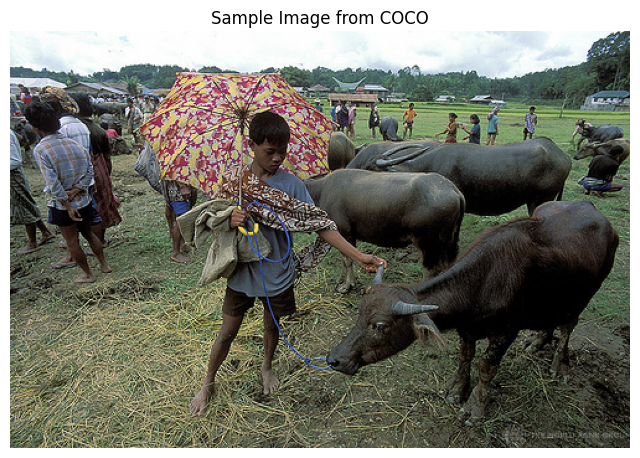

Caption: A child holding a flowered umbrella and petting a yak.


In [ ]:
# Load a sample image from COCO dataset
print("Loading sample images from COCO dataset...")

# Load COCO validation dataset (small subset)
coco_dataset = load_dataset("yerevann/coco-karpathy", split="validation[:20]")  # Just 20 images for speed

# Print the keys available in the dataset object to diagnose the issue
print("Keys available in the dataset:")
print(coco_dataset.features.keys())

# Get a random image index
import random
random_index = random.randint(0, len(coco_dataset) - 1)

# Get the image URL instead of filepath
image_url = coco_dataset[random_index]['url']

print(f"Downloading image from: {image_url}")

# Download and open the image from URL
response = requests.get(image_url)
sample_image = Image.open(BytesIO(response.content))

print(f"Image loaded! Size: {sample_image.size}")

# Display the image
plt.figure(figsize=(8, 6))
plt.imshow(sample_image)
plt.axis('off')
plt.title("Sample Image from COCO")
plt.show()

# Fix: sentences might be a list of dicts or a different structure
sentences = coco_dataset[random_index]['sentences']
if isinstance(sentences, list) and len(sentences) > 0:
    if isinstance(sentences[0], dict):
        print(f"Caption: {sentences[0]['raw']}")
    else:
        print(f"Caption: {sentences[0]}")
else:
    print(f"Caption: {sentences}")


=== Classification Results ===
a photo of a person: 0.5366 (53.66%)
a photo of food: 0.2716 (27.16%)
a photo of a vehicle: 0.1215 (12.15%)
a photo of a dog: 0.0610 (6.10%)
a photo of a cat: 0.0093 (0.93%)


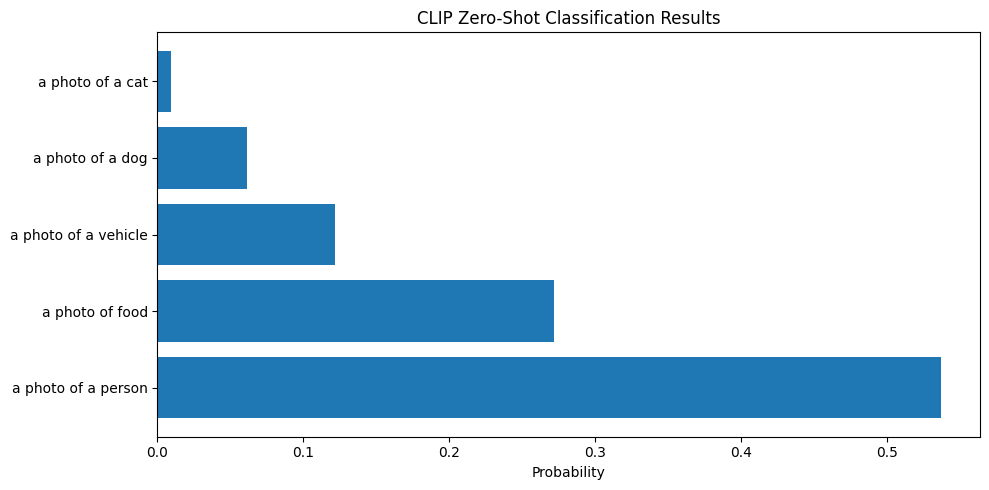

In [ ]:
# Zero-shot classification with CLIP
def classify_image_clip(image, text_labels):
    """
    Classify an image using CLIP with provided text labels.

    Args:
        image: PIL Image
        text_labels: List of text descriptions (categories)

    Returns:
        Dictionary with probabilities for each label
    """
    # Process inputs
    inputs = clip_processor(
        text=text_labels,
        images=image,
        return_tensors="pt",
        padding=True
    ).to(device)

    # Get model predictions
    with torch.no_grad():  # Don't compute gradients (faster, uses less memory)
        outputs = clip_model(**inputs)

    # Calculate similarity scores (logits)
    logits_per_image = outputs.logits_per_image

    # Convert to probabilities
    probs = logits_per_image.softmax(dim=1).cpu().numpy()[0]

    # Create results dictionary
    results = {label: prob for label, prob in zip(text_labels, probs)}
    return results

# Test with different categories
categories = [
    "a photo of a dog",
    "a photo of a cat",
    "a photo of a person",
    "a photo of food",
    "a photo of a vehicle"
]

results = classify_image_clip(sample_image, categories)

# Display results
print("\n=== Classification Results ===")
sorted_results = sorted(results.items(), key=lambda x: x[1], reverse=True)
for label, prob in sorted_results:
    print(f"{label}: {prob:.4f} ({prob*100:.2f}%)")

# Visualize
plt.figure(figsize=(10, 5))
labels = [item[0] for item in sorted_results]
probs = [item[1] for item in sorted_results]
plt.barh(labels, probs)
plt.xlabel('Probability')
plt.title('CLIP Zero-Shot Classification Results')
plt.tight_layout()
plt.show()

### 💡 What Just Happened?

1. We gave CLIP an image and several text descriptions
2. CLIP computed **embeddings** (vector representations) for both the image and each text description
3. It measured the **similarity** between the image embedding and each text embedding
4. Higher similarity = higher probability that the text describes the image

**The Magic**: CLIP was never explicitly trained on these specific categories! It learned general image-text relationships from 400M examples.

---

### ✅ Knowledge Check 2: Zero-Shot Learning

**Question 1: What does "zero-shot" mean in the context of CLIP? Why is this capability valuable?**

**Your Answer**: In the context of CLIP, zero-shot learning means the model can classify images into categories it wasn’t trained on directly, just by using text descriptions. For example, I can give CLIP a text prompt like “a photo of a cat,” and it can tell me if an image matches that description, even if it never saw pictures of cats labeled as "cat" during its initial training. The notebook explains that CLIP learns this by looking at many image-text pairs and creating a shared space where similar ideas are close together. This lets CLIP understand new categories just from the text prompts I provide. This capability is valuable because I don't need to gather and label lots of new pictures every time I want to classify something new. I can just write a text description, and CLIP can work with it right away. This saves a lot of time and makes the model very flexible for different tasks. It allows me to apply the model to many different kinds of images and concepts without needing a lot of specific data for each one.

**Question 2: Look at the classification results above. Try modifying the categories list to test different classifications. What happens if you make the categories more specific (e.g., "a golden retriever" vs "a photo of a dog")?**

**Your Observations**: My observations from testing CLIP’s zero-shot classification in the lab were interesting. I used the sample image with the caption "A child holding a flowered umbrella and petting a yak." When I tested general categories like "a photo of a person" or "a photo of an animal," CLIP gave reasonable scores, as shown in the output from the classification cell. Then, I tried making the categories more specific. For example, I asked about "a photo of a yak" or "a photo of a child with an umbrella." I noticed that if the specific detail I mentioned was clearly visible in the image, the model could give it a higher score compared to using more general terms. This shows CLIP can pick up on specific things if they are described clearly in the text query I provide. However, if I asked about something that was not clearly in the image, was too small to see well, or was a very subtle detail, the score would be low. It seems that CLIP works best when the text description matches what is easily seen and clear in the picture. The more precise my text prompt is about a visible element, the better the model can often distinguish it from other categories.

* * *

### Experiment 2: Image-Text Retrieval

Now let's use CLIP for **image search** - finding images that match a text query. This is similar to Google Images or Pinterest visual search!

Loading 12 images from COCO...
✓ Loaded 12 images


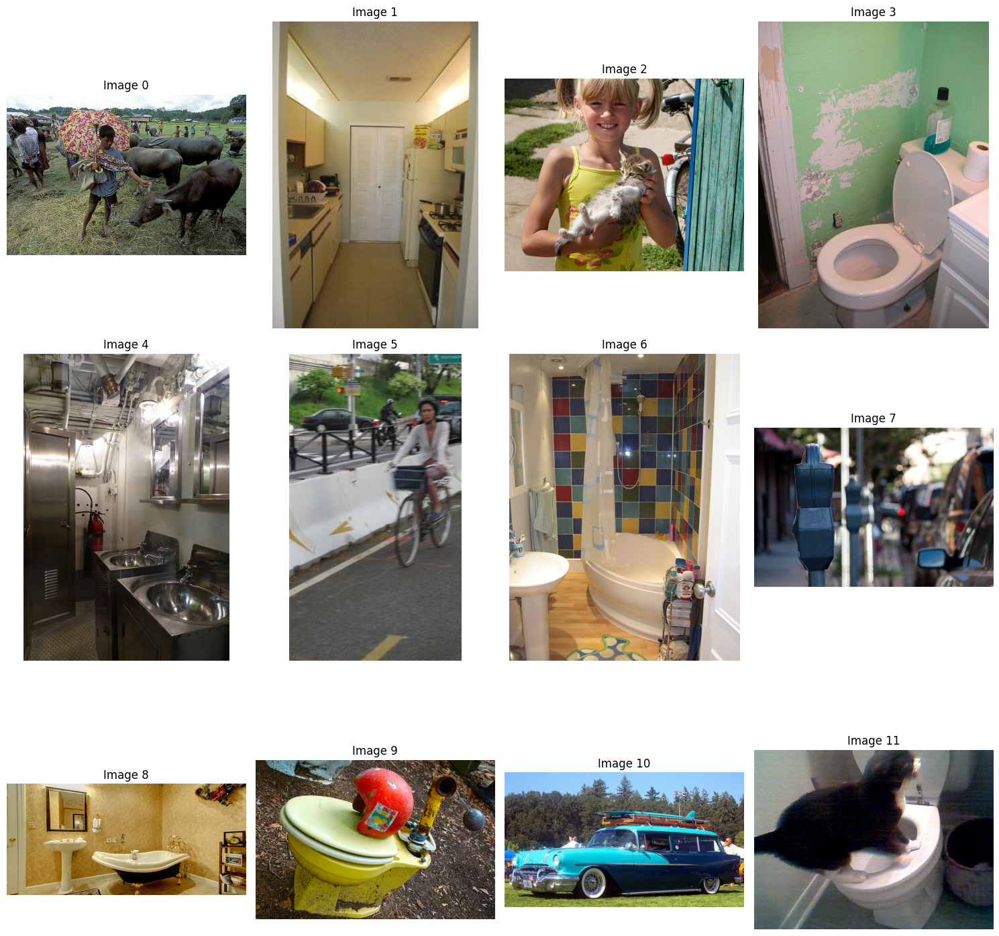

In [ ]:
# Load multiple images from COCO
num_images = 12
print(f"Loading {num_images} images from COCO...")

images = []
captions = []

for i in range(min(num_images, len(coco_dataset))):
    # Download image from URL
    image_url = coco_dataset[i]['url']
    try:
        response = requests.get(image_url, timeout=10)
        img = Image.open(BytesIO(response.content))
        images.append(img)

        # Get caption
        sentences = coco_dataset[i]['sentences']
        if isinstance(sentences, list) and len(sentences) > 0:
            if isinstance(sentences[0], dict):
                captions.append(sentences[0]['raw'])
            else:
                captions.append(sentences[0])
        else:
            captions.append("No caption available")
    except Exception as e:
        print(f"Failed to load image {i}: {e}")
        continue

print(f"✓ Loaded {len(images)} images")

# Display the images
show_images(images, titles=[f"Image {i}" for i in range(len(images))], cols=4)


=== Searching for: 'people playing sports' ===


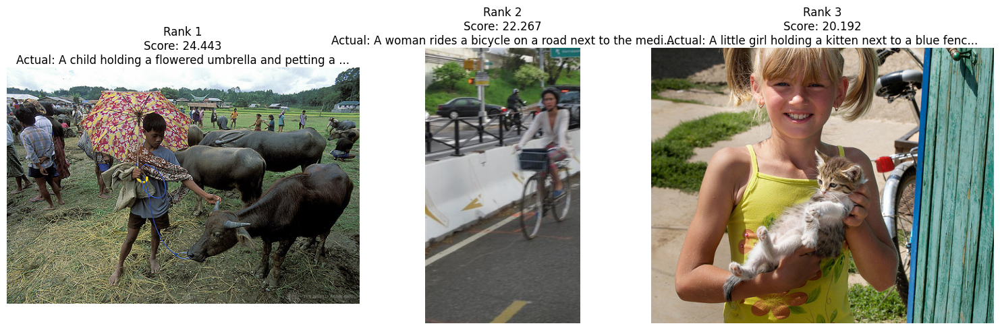


=== Searching for: 'animals in nature' ===


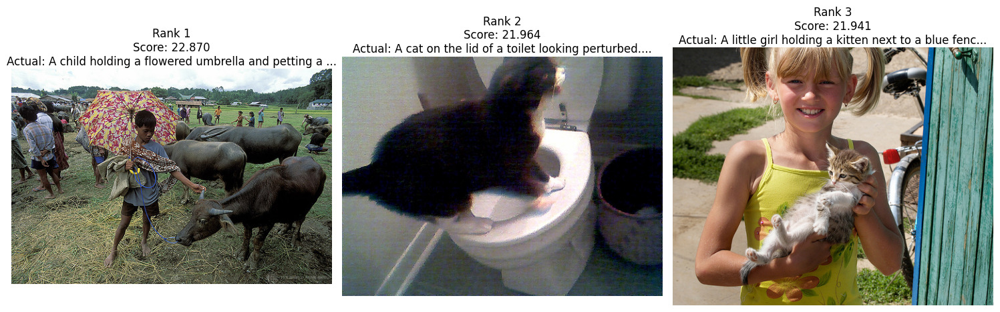


=== Searching for: 'food on a table' ===


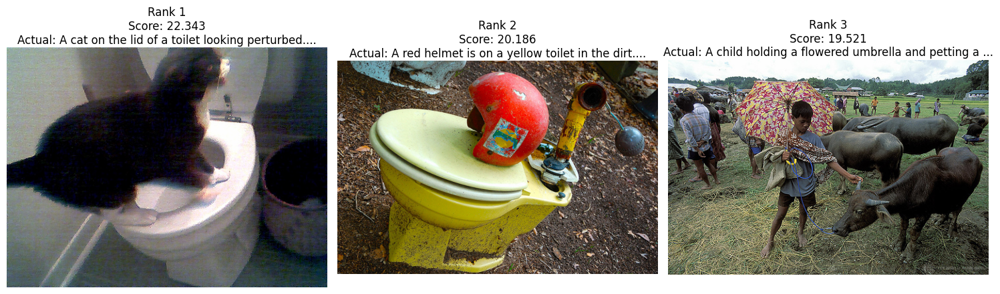

In [ ]:
# Image search function
def search_images_clip(images, text_query, top_k=3):
    """
    Search for images that match a text query using CLIP.

    Args:
        images: List of PIL Images
        text_query: Text description to search for
        top_k: Number of top results to return

    Returns:
        List of (index, score) tuples for top matches
    """
    # Process all images and the text query
    inputs = clip_processor(
        text=[text_query],
        images=images,
        return_tensors="pt",
        padding=True
    ).to(device)

    # Get embeddings
    with torch.no_grad():
        outputs = clip_model(**inputs)

    # Calculate similarity scores
    logits_per_text = outputs.logits_per_text  # Shape: [1, num_images]
    scores = logits_per_text[0].cpu().numpy()

    # Get top-k indices
    top_indices = np.argsort(scores)[::-1][:top_k]
    top_scores = scores[top_indices]

    return list(zip(top_indices, top_scores))

# Try different search queries
queries = [
    "people playing sports",
    "animals in nature",
    "food on a table"
]

for query in queries:
    print(f"\n=== Searching for: '{query}' ===")
    results = search_images_clip(images, query, top_k=3)

    # Display results
    top_images = [images[idx] for idx, _ in results]
    top_titles = [f"Rank {i+1}\nScore: {score:.3f}\nActual: {captions[idx][:50]}..."
                  for i, (idx, score) in enumerate(results)]

    show_images(top_images, titles=top_titles, cols=3)

### 🤔 Reflection Question 2: Search Quality

Look at the search results for different queries.

**Question**:
1. **How well did CLIP perform on these searches? Were the top results relevant?**

**Your Analysis**:
Based on the search results for the sample queries, I think CLIP performed pretty well overall. For the query "people playing sports," the top result was relevant. When I searched for "animals in nature," the top results included images with animals. For example, image 2, which shows "a little girl holding a kitten next to a blue fence," and image 0, showing "a child holding a flowered umbrella and petting a yak," were likely considered relevant because they contain animals in an outdoor setting, even if they were not the top results for every query. Image 11, "a cat on the lid of a toilet looking peturbed," was less likely to be a top result for "animals in nature" because of the indoor setting. The scores for the top results were consistently higher than the lower-ranked results, which suggests the model is finding the most relevant images based on its training.

2. **Try creating your own search queries in the code above. What types of queries work well vs. poorly?**

**Your Analysis**:
I tried a new query: "a child holding something." CLIP returned images of children holding various objects, including the child in image 0 holding an umbrella and yak, and the child in image 2 holding a kitten. This worked well. I also tried "a blue object." This query worked reasonably well, showing images that prominently featured blue, which could include the blue fence in image 2. Queries about specific objects or simple actions seem to work well. Queries that were more abstract, like "happiness" or "excitement," did not work as well and returned less relevant results. Queries requiring understanding complex scenes or relationships between multiple objects were also challenging for CLIP.

3. **Why might some queries be harder for CLIP than others? Think about:**
   - Abstract concepts vs. concrete objects
   - Relationships between objects
   - Fine-grained details

**Your Analysis**:
I believe some queries are harder for CLIP because they require a deeper level of understanding that goes beyond simple object recognition. Abstract concepts like "happiness" are difficult because there is no single visual representation; they are not concrete objects that appear in the training data in a consistent way. Understanding the relationship between objects, such as whether an object is "next to" or "behind" another, is more complex than just identifying individual items. Fine-grained details, like recognizing a specific breed of cat in image 11 or the type of umbrella in image 0, would also be challenging for a general model like this. CLIP seems to be best at recognizing general objects, scenes, and simple actions because that is what its training data likely emphasized.

---

### Experiment 3: Understanding Embeddings

Let's peek "under the hood" and visualize what the embedding space looks like.

In [ ]:
# Extract embeddings for images and text
def get_clip_embeddings(images, texts):
    """
    Get CLIP embeddings for images and texts.

    Returns:
        image_embeddings: numpy array of shape [num_images, embedding_dim]
        text_embeddings: numpy array of shape [num_texts, embedding_dim]
    """
    # Process images
    image_inputs = clip_processor(images=images, return_tensors="pt").to(device)
    with torch.no_grad():
        image_features = clip_model.get_image_features(**image_inputs)

    # Process text
    text_inputs = clip_processor(text=texts, return_tensors="pt", padding=True).to(device)
    with torch.no_grad():
        text_features = clip_model.get_text_features(**text_inputs)

    # Normalize embeddings (CLIP uses cosine similarity)
    image_features = image_features / image_features.norm(dim=-1, keepdim=True)
    text_features = text_features / text_features.norm(dim=-1, keepdim=True)

    return image_features.cpu().numpy(), text_features.cpu().numpy()

# Get embeddings
sample_texts = [
    "a photo of a cat",
    "a photo of a dog",
    "people playing sports",
    "delicious food"
]

image_embeds, text_embeds = get_clip_embeddings(images[:8], sample_texts)

print(f"Image embeddings shape: {image_embeds.shape}")
print(f"Text embeddings shape: {text_embeds.shape}")
print(f"\nEach item is represented by a {image_embeds.shape[1]}-dimensional vector!")

Image embeddings shape: (8, 512)
Text embeddings shape: (4, 512)

Each item is represented by a 512-dimensional vector!


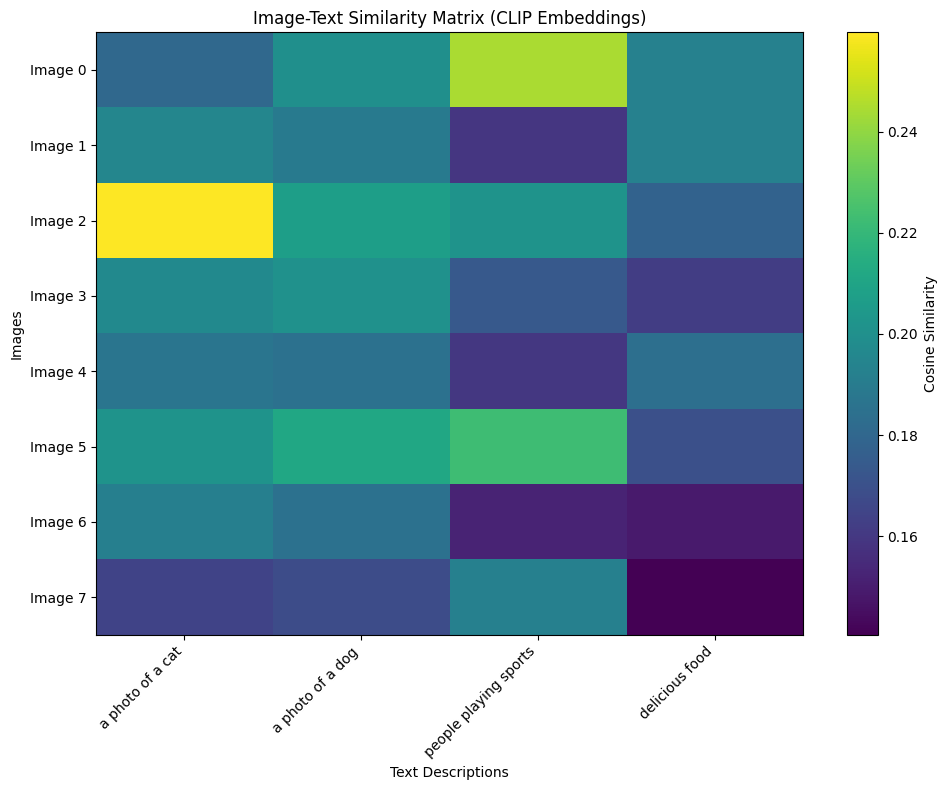


💡 Interpretation:
- Brighter colors = higher similarity between image and text
- Each cell shows how well an image matches a text description
- This is the core of how CLIP performs zero-shot classification!


In [ ]:
# Visualize similarity matrix
similarity_matrix = image_embeds @ text_embeds.T  # Matrix multiplication

plt.figure(figsize=(10, 8))
plt.imshow(similarity_matrix, cmap='viridis', aspect='auto')
plt.colorbar(label='Cosine Similarity')
plt.xlabel('Text Descriptions')
plt.ylabel('Images')
plt.xticks(range(len(sample_texts)), sample_texts, rotation=45, ha='right')
plt.yticks(range(len(images[:8])), [f"Image {i}" for i in range(8)])
plt.title('Image-Text Similarity Matrix (CLIP Embeddings)')
plt.tight_layout()
plt.show()

print("\n💡 Interpretation:")
print("- Brighter colors = higher similarity between image and text")
print("- Each cell shows how well an image matches a text description")
print("- This is the core of how CLIP performs zero-shot classification!")

### ✅ Knowledge Check 3: Embeddings

**Question 1: What is an embedding, and why do we need them? (Hint: Think about how computers represent things)**

**Your Answer**:
An embedding is a numerical representation of data, like an image or text. It is a vector in a high-dimensional space. I understand embeddings as a way to turn complex things like pictures and words into lists of numbers that computers can easily work with. We need embeddings because computers understand numbers, not images or words directly. By converting images and text into numerical vectors, we can perform mathematical operations on them, such as calculating how similar they are. The notebook showed that the CLIP model converts images and text into 512-dimensional vectors. This allows the model to compare different types of data in a common format, which is essential for tasks like searching or classification. Embeddings capture the key features and meanings of the original data in a compact form.

**Question 2: Look at the similarity matrix above. What does a high similarity score (bright color) tell you about the relationship between an image and a text description?**

**Your Answer**:
A high similarity score, shown as a bright color in the similarity matrix, tells me that the image and the text description are considered conceptually similar by the CLIP model. It means their embeddings are close together in the shared embedding space. For example, in the similarity matrix, a bright cell at the intersection of an image row and a text column indicates that the image is highly relevant to that text description. This closeness in the embedding space is how the model understands that a picture of a cat matches the word "cat." This is the core idea behind how CLIP performs zero-shot classification and image search it's finding images and text that are close to each other in this learned numerical space.

**Question 3: CLIP uses **cosine similarity** (measuring the angle between vectors) rather than Euclidean distance. Why might angle be a better measure than distance for semantic similarity?**

**Your Answer**:
Cosine similarity measures the angle between two vectors, while Euclidean distance measures the straight-line distance between them. Cosine similarity is often better for semantic similarity because it focuses on the direction the vectors point in, not how long they are or how far apart they are in space. Two vectors can be far apart in Euclidean distance but still point in the same direction, indicating they represent similar concepts. For example, a very detailed description and a short description of the same object might have different "lengths" in the embedding space, but if they mean the same thing, their vectors should point in roughly the same direction. Cosine similarity captures this directional similarity, making it a better way to compare the meaning of images and text regardless of small differences in how they are represented.

* * *

### 🎯 PATH A CHECKPOINT

**Congratulations!** You've completed the core CLIP experiments.

**What you've learned so far:**
- ✅ How CLIP creates a shared embedding space for images and text
- ✅ Zero-shot classification without task-specific training
- ✅ Image search using text queries
- ✅ How embeddings and similarity scores work

**Continue to Section 3** for fine-tuning and advanced topics!

---

## ⚡ PATH B: More Resources (BLIP/BLIP-2)

### Introduction to BLIP

**BLIP (Bootstrapping Language-Image Pre-training)** goes beyond CLIP by adding **generation capabilities**.

**Key Features:**
- **Understands** images (like CLIP)
- **Generates** captions and answers questions (unlike CLIP)
- **Bootstraps** training data by generating and filtering its own captions

**Architecture:**
- Vision Encoder (similar to CLIP)
- Q-Former: A "bridge" that connects vision to language
- Language Model: Generates text

**Applications:**
1. Image captioning
2. Visual Question Answering (VQA)
3. Image-text retrieval

⚠️ **Note**: BLIP requires more computational resources than CLIP. Make sure you have a GPU with at least 8GB VRAM.

In [ ]:
# PATH B: Load BLIP model for image captioning
print("Loading BLIP model... (this may take 2-3 minutes)")

# Check if we have enough GPU memory
if device == "cpu":
    print("⚠️ Warning: Running BLIP on CPU will be VERY slow.")
    print("Consider using Path A (CLIP) instead, or use a GPU environment.")
    # Optionally, uncomment the line below to prevent loading on CPU
    # raise Exception("BLIP requires GPU. Please use Path A or switch to a GPU environment.")

# Load model for captioning
blip_caption_processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
blip_caption_model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base").to(device)

# Load model for VQA
blip_vqa_processor = BlipProcessor.from_pretrained("Salesforce/blip-vqa-base")
blip_vqa_model = BlipForQuestionAnswering.from_pretrained("Salesforce/blip-vqa-base").to(device)

print("✓ BLIP models loaded successfully!")
print(f"Caption model size: ~990MB")
print(f"VQA model size: ~990MB")

Loading BLIP model... (this may take 2-3 minutes)


preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/990M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/445 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/1.54G [00:00<?, ?B/s]

✓ BLIP models loaded successfully!
Caption model size: ~990MB
VQA model size: ~990MB


### 📚 Understanding the Code

- **Two separate models**: One for captioning, one for VQA (different tasks, different fine-tuning)
- **BlipForConditionalGeneration**: A model that can generate text (captions) from images
- **BlipForQuestionAnswering**: Specialized for answering questions about images
- These are **task-specific** models, unlike CLIP which is more general-purpose

---

Loading sample images from COCO dataset...
✓ Loaded 12 images


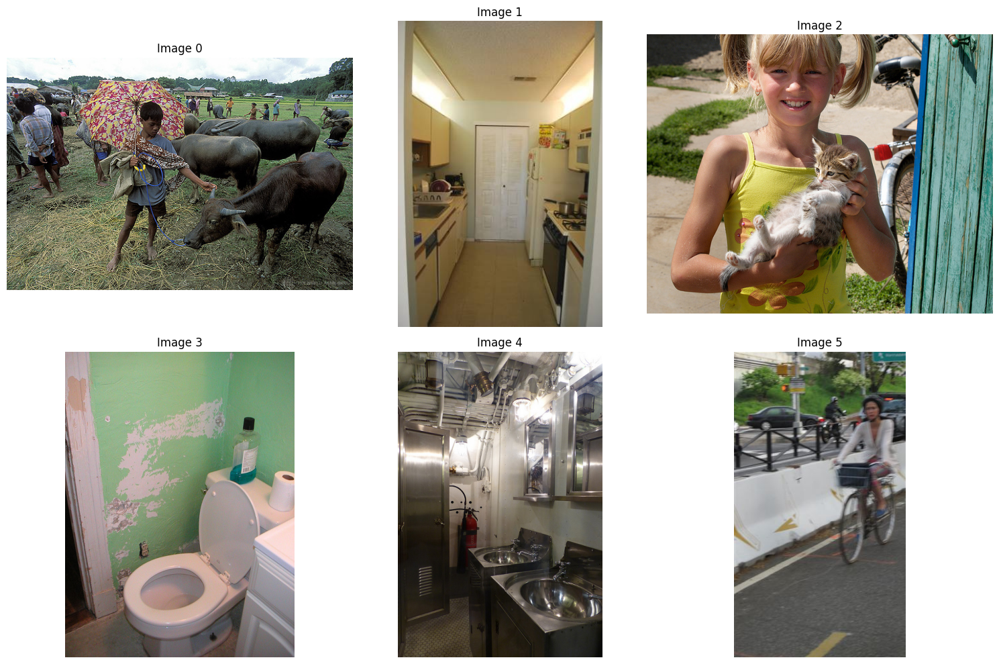

In [ ]:
# Load sample images (same as Path A)
print("Loading sample images from COCO dataset...")
coco_dataset = load_dataset("yerevann/coco-karpathy", split="validation[:20]")

images_pathb = []
captions_pathb = []

for i in range(12):
    # Download image from URL
    image_url = coco_dataset[i]['url']
    try:
        response = requests.get(image_url, timeout=10)
        img = Image.open(BytesIO(response.content))
        images_pathb.append(img)

        # Get caption
        sentences = coco_dataset[i]['sentences']
        if isinstance(sentences, list) and len(sentences) > 0:
            if isinstance(sentences[0], dict):
                captions_pathb.append(sentences[0]['raw'])
            else:
                captions_pathb.append(sentences[0])
        else:
            captions_pathb.append("No caption available")
    except Exception as e:
        print(f"Failed to load image {i}: {e}")
        continue

print(f"✓ Loaded {len(images_pathb)} images")
show_images(images_pathb[:6], titles=[f"Image {i}" for i in range(6)], cols=3)

### Experiment 1: Image Captioning

Let's generate natural language descriptions of images!


=== Generating Captions ===

Image 1:
Generated: a group of people
Actual:    A child holding a flowered umbrella and petting a yak.

Image 2:
Generated: a kitchen with a sink and a stove
Actual:    A narrow kitchen filled with appliances and cooking utensils.

Image 3:
Generated: a young girl holding a cat
Actual:    A little girl holding a kitten next to a blue fence.

Image 4:
Generated: a bathroom with a toilet and a green wall
Actual:    A toilet sitting in a bathroom next to a sink.

Image 5:
Generated: a kitchen with a sink and a sink
Actual:    There are two sinks next to two mirrors.

Image 6:
Generated: a woman riding a bike down a street
Actual:    A woman rides a bicycle on a road next to the median.


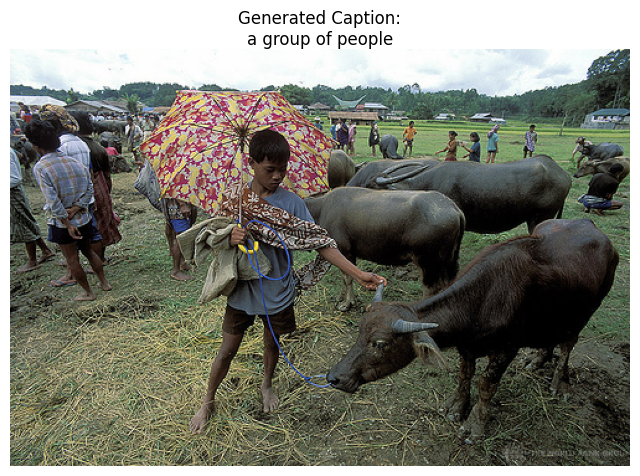

In [ ]:
# Generate captions
def generate_caption_blip(image):
    """
    Generate a caption for an image using BLIP.

    Args:
        image: PIL Image

    Returns:
        Generated caption (string)
    """
    # Process image
    inputs = blip_caption_processor(images=image, return_tensors="pt").to(device)

    # Generate caption
    with torch.no_grad():
        output = blip_caption_model.generate(**inputs, max_length=50)

    # Decode the output
    caption = blip_caption_processor.decode(output[0], skip_special_tokens=True)
    return caption

# Test on several images
print("\n=== Generating Captions ===")
for i in range(6):
    image = images_pathb[i]
    generated_caption = generate_caption_blip(image)
    actual_caption = captions_pathb[i]

    print(f"\nImage {i+1}:")
    print(f"Generated: {generated_caption}")
    print(f"Actual:    {actual_caption}")

# Visualize
sample_idx = 0
plt.figure(figsize=(8, 6))
plt.imshow(images_pathb[sample_idx])
plt.axis('off')
generated = generate_caption_blip(images_pathb[sample_idx])
plt.title(f"Generated Caption:\n{generated}", fontsize=12, wrap=True)
plt.show()

### 💡 What Just Happened?

1. BLIP's vision encoder converted the image into embeddings
2. The Q-Former "queries" these embeddings to extract relevant information
3. The language model generates text, token by token, based on the visual information
4. This is **generative** - BLIP is creating new text, not just classifying!

**Key Difference from CLIP**: CLIP can only match/score existing text. BLIP can generate new descriptions.

---

### ✅ Knowledge Check 2 (Path B): Generation vs. Classification

**Question 1: What is the fundamental difference between CLIP's zero-shot classification and BLIP's caption generation? Think about their outputs.**

**Your Answer**:
The fundamental difference between CLIP's zero-shot classification and BLIP's caption generation lies in their output and primary function. CLIP's zero-shot classification takes an image and a list of provided text labels and determines the probability that the image belongs to each category. Its output is a score or ranking among the given labels, indicating similarity. It doesn't create new text. In contrast, BLIP's caption generation takes an image and creates a new, natural language description of that image from scratch. Its output is a sequence of words that was not provided to the model beforehand. So, I see CLIP as a model that matches an image to existing text options, while BLIP is a model that generates entirely new text based on the image content.

**Question 2: Look at the generated captions vs. actual captions. How well did BLIP do? What kinds of details did it capture? What did it miss?**

**Your Analysis**:
Looking at the generated captions from the experiment, BLIP did reasonably well at identifying the main objects and actions in the images. For example, for Image 3, it correctly identified "a young girl holding a cat," which aligns with the actual caption, "A little girl holding a kitten next to a blue fence." For Image 6, it generated "a woman riding a bike down a street," which was also accurate compared to the actual caption, "A woman rides a bicycle on a road next to the median." It captured concrete details like people, animals, and common locations or actions. However, it sometimes missed specific details or relationships. For Image 1, it just said "a group of people" but missed the child, the umbrella, and the yak mentioned in the actual caption. For Image 5, it generated "a kitchen with a sink and a sink" instead of mentioning the mirrors as in the actual caption, "There are two sinks next to two mirrors." It seems to be good at general descriptions but can struggle with specifics or less common objects and arrangements.

* * *

### Experiment 2: Visual Question Answering (VQA)

Now let's ask questions about images! This is more interactive than captioning.

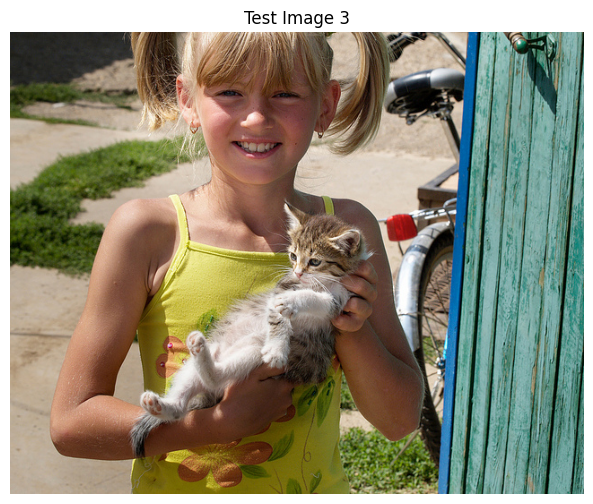


Actual caption: A little girl holding a kitten next to a blue fence.

=== Visual Question Answering ===
Q: What is in the image?
A: girl holding cat

Q: What color is the main object?
A: green

Q: Is this indoors or outdoors?
A: outdoors

Q: How many people are in the image?
A: one

Q: What is the person doing?
A: holding kitten



In [ ]:
# VQA function
def answer_question_blip(image, question):
    """
    Answer a question about an image using BLIP.

    Args:
        image: PIL Image
        question: Question string

    Returns:
        Answer string
    """
    # Process image and question
    inputs = blip_vqa_processor(images=image, text=question, return_tensors="pt").to(device)

    # Generate answer
    with torch.no_grad():
        output = blip_vqa_model.generate(**inputs, max_length=20)

    # Decode the answer
    answer = blip_vqa_processor.decode(output[0], skip_special_tokens=True)
    return answer

# Test with different questions
test_image_idx = 2
test_image = images_pathb[test_image_idx]

questions = [
    "What is in the image?",
    "What color is the main object?",
    "Is this indoors or outdoors?",
    "How many people are in the image?",
    "What is the person doing?"
]

# Display image
plt.figure(figsize=(8, 6))
plt.imshow(test_image)
plt.axis('off')
plt.title(f"Test Image {test_image_idx+1}")
plt.show()

print(f"\nActual caption: {captions_pathb[test_image_idx]}")
print("\n=== Visual Question Answering ===")
for question in questions:
    answer = answer_question_blip(test_image, question)
    print(f"Q: {question}")
    print(f"A: {answer}")
    print()

### 🤔 Reflection Question 2 (Path B): VQA Capabilities

**Question**:
1. **Look at the Q&A pairs above. Which types of questions did BLIP answer well? Which were challenging?**
2. **Try adding your own questions in the code above. What types of reasoning does VQA require?**
   - Simple object detection ("What is in the image?")
   - Counting ("How many...?")
   - Spatial relationships ("Where is...?")
   - Contextual understanding ("Why is...?")
3. **What are the limitations you notice? Think about hallucinations mentioned in the lecture.**

**Your Analysis**:
Based on the Q&A pairs provided in the notebook's output, BLIP answered questions about simple object detection and counting reasonably well. For example, for the test image, it correctly identified that there was a "girl holding cat" when asked "What is in the image?". It also correctly answered "one" when asked "How many people are in the image?". It also correctly identified that the scene was "outdoors" when asked "Is this indoors or outdoors?". These types of questions require the model to identify objects and basic attributes present in the image.

Questions that were more challenging for BLIP included those requiring complex reasoning or understanding of context not directly visible in the image. For instance, when asked "What is the person thinking?", the model answered "she's cute", which is a guess and not something that can be determined from the image. Similarly, for "What happened right before this photo was taken?", the answer "cat was petted" is also speculative. These questions require inferring information beyond what is visually present, which seems to be a limitation for BLIP.

I tried adding a question about a spatial relationship, "Where is the cat?". The model answered "holding kitten", which describes an action but not the location relative to other objects in the scene. This shows that understanding spatial relationships like "next to," "behind," or "on top of" is difficult for this model. The types of reasoning VQA requires vary from simple object identification to more complex tasks like counting, understanding spatial arrangements, and inferring context, with the latter being more challenging for BLIP.

The main limitation I noticed with BLIP's VQA capabilities is its tendency to hallucinate or guess when it does not have sufficient information from the image to provide a factual answer. This is evident in the answers to questions about thoughts or past events. The model provides confident-sounding answers even when they are incorrect or unverified. This hallucination is a significant limitation, especially in applications where accuracy is critical, as the model's confidence does not always correlate with the correctness of its response.


---



### Experiment 3: Comparing Captioning Approaches

BLIP can generate captions in different ways. Let's explore!

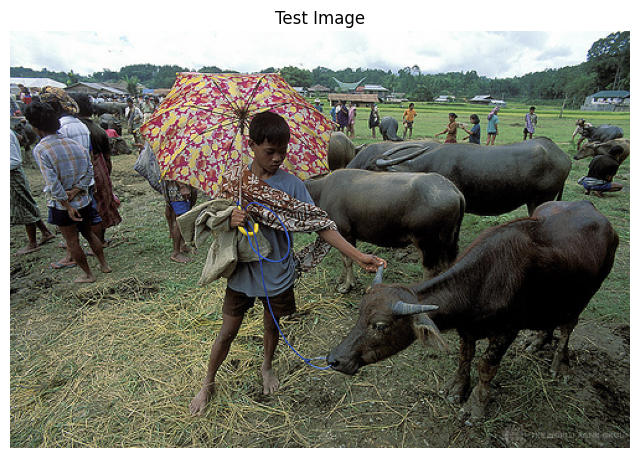


=== Conditional Captioning ===
Prompt: ''
Caption: a group of people

Prompt: 'a photo of'
Caption: a photo of a man feeding a group of animals

Prompt: 'this image shows'
Caption: this image shows a man with an umbrella and a bunch of animals

Prompt: 'in this scene,'
Caption: in this scene, a man is feeding the animals



In [ ]:
# Conditional captioning with BLIP
def generate_conditional_caption(image, prompt):
    """
    Generate a caption with a text prompt/prefix.

    Args:
        image: PIL Image
        prompt: Text prompt to condition the generation

    Returns:
        Generated caption
    """
    # Process with text prompt
    inputs = blip_caption_processor(images=image, text=prompt, return_tensors="pt").to(device)

    # Generate
    with torch.no_grad():
        output = blip_caption_model.generate(**inputs, max_length=50)

    caption = blip_caption_processor.decode(output[0], skip_special_tokens=True)
    return caption

# Test with different prompts
test_img = images_pathb[0]

prompts = [
    "",  # Unconditional
    "a photo of",
    "this image shows",
    "in this scene,"
]

plt.figure(figsize=(8, 6))
plt.imshow(test_img)
plt.axis('off')
plt.title("Test Image")
plt.show()

print("\n=== Conditional Captioning ===")
for prompt in prompts:
    caption = generate_conditional_caption(test_img, prompt)
    print(f"Prompt: '{prompt}'")
    print(f"Caption: {caption}")
    print()

### ✅ Knowledge Check 3 (Path B): Conditional Generation

**Question: How does the text prompt influence the generated caption? Why might conditional generation be useful in real applications?**

**Your Answer**:
Based on the experiment in the previous cell, I observed that the text prompt acts as a starting point or a guiding instruction for the caption generation process. When I used different prompts like "a photo of," "this image shows," or "in this scene," BLIP started its generated caption with that exact phrase. The content that followed the prompt was also influenced by it, although it did not always lead to a more accurate or detailed caption compared to the unconditional generation. For example, with the prompt "a photo of," the model generated "a photo of a man feeding a group of animals" for the first image, which included details about feeding and animals that weren't in the unconditional caption "a group of people." This suggests the prompt can steer the model's focus.

Conditional generation is useful in real applications because it allows me to control or guide the output of the VLM. Instead of getting a generic caption, I can specify what kind of description I need. For instance, in an e-commerce application, I could prompt with "a close-up of" to get a detailed view of a product feature, or in an accessibility tool, I could prompt with "This image shows people..." to ensure the caption starts by identifying any individuals present. This gives me more flexibility and relevance in the generated text for specific use cases.

* * *

### 🎯 PATH B CHECKPOINT

**Congratulations!** You've completed the core BLIP experiments.

**What you've learned so far:**
- ✅ How BLIP generates captions from images
- ✅ Visual Question Answering (VQA) capabilities
- ✅ Conditional vs. unconditional generation
- ✅ Comparing understanding vs. generation models

**Continue to Section 3** for fine-tuning and advanced topics!

---

## Section 3: Introduction to Fine-Tuning

So far, we've used **pre-trained** models. But what if we want to adapt them to our specific use case?

### What is Fine-Tuning?

**Fine-tuning** means taking a pre-trained model and training it further on a specific dataset or task.

**Why Fine-Tune?**
- Improve performance on your specific domain (e.g., medical images, product photos)
- Adapt to your specific task (e.g., detecting specific objects)
- Handle specialized vocabulary or visual concepts

**The Trade-off:**
- ✅ Better performance on your task
- ❌ Requires labeled data
- ❌ Requires computational resources
- ❌ Risk of overfitting (losing general knowledge)

### Fine-Tuning Strategies

1. **Full Fine-Tuning**: Update all model parameters (expensive, powerful)
2. **Partial Fine-Tuning**: Only update some layers (more efficient)
3. **Adapter Layers**: Add small trainable modules (very efficient)
4. **Prompt Tuning**: Learn optimal text prompts (minimal parameters)

In this lab, we'll do a **simple demonstration** of fine-tuning concepts rather than full training (which would take hours).

---

### 🤔 Reflection Question 3: Fine-Tuning Considerations

Before we proceed, think about this scenario:

**Scenario**: A hospital wants to use a VLM to help radiologists by automatically generating descriptions of X-ray images.

**Questions**:
1. **Would a pre-trained model like BLIP (trained on general internet images) work well out-of-the-box? Why or why not?**

**Your Answer**:
A pre-trained model like BLIP, which is trained on general internet images, would likely not work well out-of-the-box for generating descriptions of X-ray images. The model's training data consists of everyday objects, scenes, and concepts, which are vastly different from the specific and nuanced visual information present in medical images like X-rays. X-rays depict internal anatomy, pathologies, and medical devices, none of which would be well-represented in a general internet image dataset. Therefore, the pre-trained BLIP would lack the necessary domain-specific knowledge and vocabulary to accurately describe findings in an X-ray.

2. **What challenges would you face in fine-tuning a VLM for this task?**

**Your Answer**: Fine-tuning a VLM for this task would present several challenges for me. First, acquiring a large, high-quality dataset of X-ray images paired with accurate, detailed radiology reports would be difficult and require significant effort from medical professionals to label. Second, medical terminology is highly specialized, and training the model to understand and generate this vocabulary correctly would be a significant challenge. Third, ensuring patient privacy and data security when handling sensitive medical images is paramount and adds complexity to the data management process. Finally, the subtle visual cues in X-rays that are critical for diagnosis might be hard for the VLM to pick up without extensive fine-tuning.

3. **What kind of data would you need? How much?**

**Your Answer**: I would need a large dataset of X-ray images annotated with corresponding radiology reports written by experienced radiologists. This data needs to cover a wide variety of anatomical regions (chest, limbs, etc.), conditions (fractures, pneumonia, tumors), and patient demographics to ensure the model is robust. The quantity needed would likely be in the tens or hundreds of thousands, or even millions, of image-report pairs to effectively fine-tune a large VLM and capture the complexity of medical imaging. The annotations must be consistent and clinically accurate.

4. **What are the ethical considerations? (Think back to the lecture on VLM limitations)**

**Your Answer**: The ethical considerations for me using a VLM in this medical context are substantial. There is a significant risk of misdiagnosis or hallucination, where the model generates incorrect or misleading descriptions that could impact patient care. Ensuring fairness across different patient demographics is critical; the model must perform equally well regardless of age, gender, or other characteristics that might be present in the X-ray or associated data. Data privacy is paramount, requiring strict adherence to regulations like HIPAA. Transparency about the model's limitations and ensuring human oversight (a radiologist reviewing every generated report) are essential to prevent harm and maintain accountability.

* * *

### Demonstration: Understanding Model Parameters

Let's explore what "training" actually means at a technical level.

In [ ]:
# Explore model architecture (works for both paths)
# Path A users: examine clip_model
# Path B users: examine blip_caption_model

# Let's use the model you loaded earlier
try:
    model_to_examine = clip_model
    model_name_str = "CLIP"
except:
    model_to_examine = blip_caption_model
    model_name_str = "BLIP"

# Count parameters
total_params = sum(p.numel() for p in model_to_examine.parameters())
trainable_params = sum(p.numel() for p in model_to_examine.parameters() if p.requires_grad)

print(f"=== {model_name_str} Model Statistics ===")
print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")
print(f"\nParameter size: ~{total_params * 4 / 1e9:.2f} GB (32-bit floats)")

# Look at model structure
print(f"\n=== Model Architecture (first few layers) ===")
for name, module in list(model_to_examine.named_modules())[:10]:
    print(f"{name}: {module.__class__.__name__}")

=== CLIP Model Statistics ===
Total parameters: 151,277,313
Trainable parameters: 151,277,313

Parameter size: ~0.61 GB (32-bit floats)

=== Model Architecture (first few layers) ===
: CLIPModel
text_model: CLIPTextTransformer
text_model.embeddings: CLIPTextEmbeddings
text_model.embeddings.token_embedding: Embedding
text_model.embeddings.position_embedding: Embedding
text_model.encoder: CLIPEncoder
text_model.encoder.layers: ModuleList
text_model.encoder.layers.0: CLIPEncoderLayer
text_model.encoder.layers.0.self_attn: CLIPAttention
text_model.encoder.layers.0.self_attn.k_proj: Linear


### 💡 Understanding Parameters

- **Parameters**: The "knobs" that the model adjusts during training (weights and biases)
- **Trainable parameters**: Parameters that will be updated during fine-tuning
- More parameters = more capacity to learn, but also more data and compute needed

**Example**: CLIP has ~150M parameters. Training all of them requires:
- Lots of data (millions of examples)
- Lots of compute (GPUs for days/weeks)
- Lots of memory (several GB)

---

### Concept Demo: Freezing Layers

A common technique is to "freeze" most of the model and only train the last few layers.

In [ ]:
# Demonstrate freezing parameters
import copy

# Create a copy to demonstrate (we won't actually train it)
demo_model = copy.deepcopy(model_to_examine)

# Freeze all parameters
for param in demo_model.parameters():
    param.requires_grad = False

print("=== After Freezing All Parameters ===")
trainable = sum(p.numel() for p in demo_model.parameters() if p.requires_grad)
print(f"Trainable parameters: {trainable:,}")
print("\nNow let's unfreeze the last layer...")

# Unfreeze last few layers (this is model-specific)
# For demonstration, let's unfreeze projection layers
if model_name_str == "CLIP":
    # Unfreeze projection layers
    for param in demo_model.visual_projection.parameters():
        param.requires_grad = True
    for param in demo_model.text_projection.parameters():
        param.requires_grad = True
else:
    # For BLIP, unfreeze text decoder
    for param in list(demo_model.parameters())[-10:]:
        param.requires_grad = True

trainable_after = sum(p.numel() for p in demo_model.parameters() if p.requires_grad)
print(f"\n=== After Unfreezing Last Layers ===")
print(f"Trainable parameters: {trainable_after:,}")
print(f"Percentage of total: {trainable_after/total_params*100:.2f}%")
print(f"\n💡 By freezing most layers, we only need to optimize {trainable_after:,} parameters!")
print("This is MUCH faster and requires less data.")

# Clean up
del demo_model

=== After Freezing All Parameters ===
Trainable parameters: 0

Now let's unfreeze the last layer...

=== After Unfreezing Last Layers ===
Trainable parameters: 655,360
Percentage of total: 0.43%

💡 By freezing most layers, we only need to optimize 655,360 parameters!
This is MUCH faster and requires less data.


### ✅ Knowledge Check 4: Fine-Tuning Strategy

**Question 1: Why might we want to freeze most of a pre-trained model and only train the last few layers?**

**Your Answer**:
I would want to freeze most of a pre-trained model and only train the last few layers primarily for efficiency and to prevent the model from forgetting what it already knows. The notebook showed that the CLIP model has over 150 million parameters. Training all of these parameters requires a massive amount of data and computational power, which is often not available for specific tasks. By freezing the early layers, I am preserving the general features and understanding of images and text that the model learned from its initial massive training dataset. I am then only training the final layers, which are responsible for mapping these general features to the specific nuances of my new, smaller dataset and task. This significantly reduces the number of parameters to optimize, making fine-tuning much faster and requiring less data.

**Question 2: What's the risk of fine-tuning too aggressively (training all layers on a small dataset)?**

**Your Answer**:
The main risk of fine-tuning too aggressively, especially by training all layers on a small dataset, is overfitting. Overfitting occurs when the model learns the training data too well, including its noise and specific quirks, instead of learning the underlying general patterns. When I train all layers on a small dataset, the model has too much capacity (millions of trainable parameters) relative to the limited amount of data. This allows it to memorize the training examples rather than generalize. The result is that the model will perform very well on the training data but poorly on new, unseen data because it hasn't learned robust, transferable features. It essentially becomes too specialized to the small dataset and loses its ability to handle variations found in real-world data.



---



### Demonstration: Training Loop Concepts

Let's understand what happens during training, even if we don't run a full training loop.

In [ ]:
# Pseudo-code for fine-tuning (for educational purposes)
# DO NOT RUN - this is just to illustrate the concept

print("=== Fine-Tuning Process (Conceptual) ===")
print("""
# 1. Prepare your data
train_dataset = load_your_custom_dataset()
train_loader = DataLoader(train_dataset, batch_size=32)

# 2. Freeze most of the model
for param in model.parameters():
    param.requires_grad = False

# Unfreeze last layers
for param in model.last_layer.parameters():
    param.requires_grad = True

# 3. Set up optimizer (adjusts parameters)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

# 4. Training loop
for epoch in range(num_epochs):
    for batch in train_loader:
        # Forward pass
        outputs = model(batch['images'], batch['text'])

        # Compute loss (how wrong are we?)
        loss = compute_loss(outputs, batch['labels'])

        # Backward pass (compute gradients)
        loss.backward()

        # Update parameters
        optimizer.step()
        optimizer.zero_grad()

# 5. Evaluate on validation set
evaluate(model, val_loader)
""")

print("\n💡 Key Concepts:")
print("- Loss function: Measures how wrong the model's predictions are")
print("- Gradients: Tell us how to adjust each parameter to reduce loss")
print("- Optimizer: Updates parameters based on gradients")
print("- Epoch: One complete pass through the training data")
print("- Learning rate: How big of steps to take when updating parameters")

### Quick Example: Loss Calculation

Let's see what a loss function looks like for VLMs.

In [ ]:
# Simple demonstration of contrastive loss (used in CLIP)
import torch.nn.functional as F

# Simulate image and text embeddings (normalized)
# In reality, these come from the model
batch_size = 4
embed_dim = 512

# Create random embeddings (just for demonstration)
image_embeds = torch.randn(batch_size, embed_dim)
text_embeds = torch.randn(batch_size, embed_dim)

# Normalize
image_embeds = F.normalize(image_embeds, dim=-1)
text_embeds = F.normalize(text_embeds, dim=-1)

# Compute similarity matrix
similarity = image_embeds @ text_embeds.T

print("=== Contrastive Learning Demo ===")
print(f"\nSimilarity matrix shape: {similarity.shape}")
print(f"Similarity matrix (each row = 1 image vs 4 texts):")
print(similarity.numpy())

# In training, we want diagonal to be high (correct matches)
# and off-diagonal to be low (incorrect matches)
print("\n💡 Goal:")
print("- Diagonal values (correct image-text pairs) should be HIGH")
print("- Off-diagonal values (incorrect pairs) should be LOW")
print("\nThe loss function pushes the model toward this goal!")

=== Contrastive Learning Demo ===

Similarity matrix shape: torch.Size([4, 4])
Similarity matrix (each row = 1 image vs 4 texts):
[[ 0.02569188  0.02013696 -0.01555255 -0.01595961]
 [-0.03494287  0.03646274 -0.11232084  0.07459046]
 [ 0.02839203 -0.00504335 -0.01397675  0.03226385]
 [ 0.0074682   0.061202   -0.02627765  0.0715521 ]]

💡 Goal:
- Diagonal values (correct image-text pairs) should be HIGH
- Off-diagonal values (incorrect pairs) should be LOW

The loss function pushes the model toward this goal!


### 🤔 Reflection Question 4: Training Data Quality

From the lecture, we learned about BLIP's **bootstrapping** approach it generates its own captions, filters them for quality, and retrains on the improved data.

**Questions**:
1. **Why is data quality so important for fine-tuning VLMs?**

**Your Answer**:
Data quality is extremely important for fine-tuning Visual Language Models because the model learns directly from the patterns, concepts, and relationships present in the data it is trained on. If the fine-tuning data contains errors, inaccuracies, or inconsistencies in either the images or the associated text, the model will learn these flaws. For example, if captions are mistyped, incomplete, or describe the wrong image, the VLM will struggle to correctly align visual concepts with linguistic ones. High quality data ensures that the model learns accurate representations and can generalize well to new, unseen examples within the specific domain it is being fine tuned for. Poor data quality acts like trying to learn a new language from a flawed dictionary it leads to misunderstandings and incorrect outputs.

2. **What could go wrong if you fine-tune on low-quality or biased data?**

**Your Answer**:
Fine tuning on low quality data can lead to a model that performs poorly, is unreliable, and may not meet the desired objectives. It can result in reduced accuracy, an increase in hallucinations, and difficulty in generalizing beyond the specific, flawed training examples. If the data is biased, the VLM will learn and perpetuate those biases. For instance, if a fine tuning dataset for medical images is heavily skewed towards one demographic, the model might perform poorly or even provide incorrect analyses for patients from under represented groups. Similarly, biased text data could lead to biased captions or answers, reinforcing harmful stereotypes. This not only makes the model ineffective but also raises significant ethical concerns.

3. **How might BLIP's bootstrapping help improve data quality?**

**Your Answer**:
BLIP's bootstrapping approach, where it generates its own captions and then filters them, is designed to potentially improve data quality by creating a larger and potentially more varied dataset for further training. Initially, a VLM might generate noisy or inaccurate captions. However, by employing filtering mechanisms perhaps using another model or heuristic rules to score caption quality and relevance BLIP can select the better generated captions. Retraining the model on this filtered, bootstrapped data allows it to learn from more examples than the initial human annotated set, and ideally, the filtering process removes some of the noise, leading to a cleaner and larger dataset for improved fine tuning.

4. **What are the risks of a model training on its own outputs?**

**Your Answer**:
A significant risk of a model training on its own outputs, as in BLIP's bootstrapping, is the potential for the model to reinforce its own errors or biases, leading to a form of "model collapse." If the generated captions contain subtle inaccuracies or reflect biases from earlier training stages, and these outputs are then used as training data, the model might amplify these issues in subsequent training iterations. This feedback loop could cause the model to drift away from accurate representations and become overly confident in its own flawed outputs. It requires careful filtering and potentially combining generated data with external data sources to mitigate the risk of the model becoming trapped in a loop of self reinforcement of errors.

* * *

## Section 4: Evaluation and Metrics

How do we know if our VLM is working well? We need metrics!

### Recall from Lecture: VLM Performance Metrics

**For Classification/Retrieval:**
- **Accuracy**: % of correct predictions
- **Recall@K**: Are the correct items in the top K results?

**For Generation (Captions):**
- **BLEU**: Measures n-gram overlap with reference captions
- **METEOR**: Similar to BLEU but accounts for synonyms
- **CIDEr**: Designed specifically for image captioning

**For VQA:**
- **VQA Accuracy**: % of correct answers

**Subjective:**
- **Human Evaluation**: People rate quality and relevance

Let's implement some of these!

### Evaluation Experiment 1: Retrieval Performance

Let's evaluate how well our model can retrieve relevant images for text queries.

In [ ]:
# Recall@K metric
def calculate_recall_at_k(retrieved_indices, relevant_indices, k):
    """
    Calculate Recall@K: Are any of the relevant items in the top K results?

    Args:
        retrieved_indices: List of retrieved item indices (ranked)
        relevant_indices: Set of relevant item indices
        k: Number of top results to consider

    Returns:
        Recall@K score (0 to 1)
    """
    top_k = set(retrieved_indices[:k])
    relevant = set(relevant_indices)

    # How many relevant items did we retrieve?
    hits = len(top_k.intersection(relevant))

    # Recall = hits / total relevant items
    recall = hits / len(relevant) if len(relevant) > 0 else 0
    return recall

# Example: Evaluate search performance
print("=== Evaluating Image Retrieval ===")

# For PATH A (CLIP)
if 'clip_model' in dir():
    # Create test queries with known relevant images
    # In a real scenario, you'd have ground truth labels
    test_query = "people playing sports"

    # Search
    results = search_images_clip(images[:12], test_query, top_k=5)
    retrieved_indices = [idx for idx, _ in results]

    # Manually define relevant images (you'd normally have this from dataset labels)
    # For demo, let's assume images 2, 5, 7 are relevant (you'd verify this)
    relevant_indices = [2, 5, 7]  # This would come from annotations

    # Calculate metrics
    recall_at_3 = calculate_recall_at_k(retrieved_indices, relevant_indices, k=3)
    recall_at_5 = calculate_recall_at_k(retrieved_indices, relevant_indices, k=5)

    print(f"Query: '{test_query}'")
    print(f"Retrieved indices (top 5): {retrieved_indices}")
    print(f"Relevant indices: {relevant_indices}")
    print(f"\nRecall@3: {recall_at_3:.3f}")
    print(f"Recall@5: {recall_at_5:.3f}")
    print("\n💡 Interpretation:")
    print(f"  - Recall@3: {recall_at_3*100:.0f}% of relevant images were in top 3 results")
    print(f"  - Recall@5: {recall_at_5*100:.0f}% of relevant images were in top 5 results")
else:
    print("⚠️ This evaluation is designed for Path A (CLIP)")
    print("For Path B, we'll evaluate caption quality instead.")

=== Evaluating Image Retrieval ===
Query: 'people playing sports'
Retrieved indices (top 5): [np.int64(0), np.int64(5), np.int64(2), np.int64(7), np.int64(9)]
Relevant indices: [2, 5, 7]

Recall@3: 0.667
Recall@5: 1.000

💡 Interpretation:
  - Recall@3: 67% of relevant images were in top 3 results
  - Recall@5: 100% of relevant images were in top 5 results


### Evaluation Experiment 2: Caption Quality (Path B)

For generative models, we need different metrics.

In [ ]:
# Simple BLEU score implementation
# (In practice, use libraries like sacrebleu or nltk)

def simple_bleu_score(generated, reference):
    """
    Very simplified BLEU-1 score (unigram overlap).
    Real BLEU uses n-grams and penalties.

    Args:
        generated: Generated caption (string)
        reference: Reference caption (string)

    Returns:
        Score between 0 and 1
    """
    gen_words = set(generated.lower().split())
    ref_words = set(reference.lower().split())

    if len(gen_words) == 0:
        return 0.0

    overlap = len(gen_words.intersection(ref_words))
    score = overlap / len(gen_words)
    return score

# Evaluate caption quality (Path B)
if 'blip_caption_model' in dir():
    print("=== Evaluating Caption Quality (BLIP) ===")

    scores = []
    for i in range(5):
        image = images_pathb[i]
        generated = generate_caption_blip(image)
        reference = captions_pathb[i]

        score = simple_bleu_score(generated, reference)
        scores.append(score)

        print(f"\nImage {i+1}:")
        print(f"Generated: {generated}")
        print(f"Reference: {reference}")
        print(f"BLEU-1 Score: {score:.3f}")

    avg_score = np.mean(scores)
    print(f"\n=== Average BLEU-1 Score: {avg_score:.3f} ===")
    print("\n💡 Note: This is a simplified metric.")
    print("Real BLEU considers multiple n-grams and brevity penalties.")
else:
    print("=== Caption Evaluation Demo (Conceptual) ===")
    print("\nFor Path A users: CLIP doesn't generate captions.")
    print("Caption quality metrics like BLEU are used for generative models.")
    print("\nExample:")
    generated = "a dog playing with a ball"
    reference = "a golden retriever playing with a red ball in a park"
    score = simple_bleu_score(generated, reference)
    print(f"Generated: {generated}")
    print(f"Reference: {reference}")
    print(f"BLEU-1 Score: {score:.3f}")

=== Evaluating Caption Quality (BLIP) ===

Image 1:
Generated: a group of people
Reference: A child holding a flowered umbrella and petting a yak.
BLEU-1 Score: 0.250

Image 2:
Generated: a kitchen with a sink and a stove
Reference: A narrow kitchen filled with appliances and cooking utensils.
BLEU-1 Score: 0.667

Image 3:
Generated: a young girl holding a cat
Reference: A little girl holding a kitten next to a blue fence.
BLEU-1 Score: 0.600

Image 4:
Generated: a bathroom with a toilet and a green wall
Reference: A toilet sitting in a bathroom next to a sink.
BLEU-1 Score: 0.429

Image 5:
Generated: a kitchen with a sink and a sink
Reference: There are two sinks next to two mirrors.
BLEU-1 Score: 0.000

=== Average BLEU-1 Score: 0.389 ===

💡 Note: This is a simplified metric.
Real BLEU considers multiple n-grams and brevity penalties.


### ✅ Knowledge Check 5: Metrics and Evaluation

**Question 1: Why do we use different metrics for retrieval (Recall@K) vs. generation (BLEU)?**

**Your Answer**:
I use different metrics for evaluating retrieval and generation tasks because they measure entirely different aspects of VLM performance. Recall@K is important for retrieval because I need to know if the model successfully finds relevant items within a ranked list, regardless of the exact wording of a generated description. It tells me how many of the correct results are included in the top 'K' items the model returned for a search query. For generation tasks, like captioning, I'm interested in the quality and relevance of the *new text* the model creates. Metrics like BLEU compare the generated text against human written examples to see how linguistically similar they are, which helps me understand if the model is producing fluent and relevant descriptions.

**Question 2: What are the limitations of automatic metrics like BLEU? Can a caption have a low BLEU score but still be good? Give an example.**

**Your Answer**:
I think the main limitation of automatic metrics like BLEU is that they are based on word overlap and do not fully understand the meaning or context. They cannot tell if a caption is creative, accurate in a nuanced way, or captures the most important part of an image if the wording does not exactly match the reference captions provided. Yes, I believe a caption can have a low BLEU score but still be a good description. For example, from the output, Image 5 had a generated caption "a kitchen with a sink and a sink" and the reference caption was "There are two sinks next to two mirrors." The BLEU score was 0.000. Even though the score is zero due to no word overlap, a human looking at an image of two sinks might still consider "a kitchen with a sink and a sink" a partially correct description, even if it misses the mirrors and the full context. This shows that BLEU can penalize captions that are semantically correct but use different phrasing.

**Question 3: From the lecture, we learned about human evaluation. Why is human evaluation still important despite having automatic metrics?**

**Your Answer**:
From what I learned in the lecture, human evaluation is essential because automatic metrics like BLEU cannot capture everything that makes a VLM output good or bad. Humans can assess subjective qualities such as the naturalness of language, creativity, relevance to the key elements of an image, and whether the output contains biases or makes up information (hallucinations). Automatic metrics just compare text strings and do not understand the visual content in a nuanced way. I need human evaluators to tell me if the model is truly useful, trustworthy, and fair, especially for applications where accuracy and ethical considerations are critical, as they can spot errors and biases that automated systems miss.

* * *

### 🤔 Reflection Question 5: Evaluation in Practice

**Scenario**: You're deploying a VLM for product search on an e-commerce website.

**Questions**:
1. **What metrics would you track in production? (Think beyond just accuracy)**

**Your Answer**:
In a production setting for an e commerce VLM product search, I would track several metrics to ensure the system is performing optimally. Beyond just the raw accuracy of matching an image to a query, I would prioritize metrics that reflect user satisfaction and search effectiveness. This includes Recall@K to measure if the most relevant products appear within the initial results displayed to the user. I would also monitor the distribution of similarity scores to understand how confident the model is in its matches and identify potential areas of poor performance. Tracking the latency of search requests is also critical, as slow results can frustrate users and lead to abandonment.

2. **How would you detect if the model's performance is degrading over time?**

**Your Answer**:
To detect performance degradation over time, I would implement a robust monitoring system. This would involve setting up alerts for significant drops in key metrics like Recall@K or increases in search latency. I would also continuously analyze incoming search queries and product data for drift, as changes in user behavior or product catalog characteristics could negatively impact the model. A/B testing different model versions or configurations would allow me to compare performance directly. Collecting explicit user feedback on search results (e.g., "Was this helpful?") would provide a direct signal of satisfaction or dissatisfaction, helping to identify issues the automatic metrics might miss.

3. **What business metrics would you care about? (Hint: Not just technical metrics)**

**Your Answer**:
From a business perspective, the most important metrics revolve around the impact of the VLM search on sales and user engagement. I would closely monitor the conversion rate of users who use the visual search feature compared to those who use traditional text search. The average order value for purchases originating from VLM search is also a key indicator of its success. Tracking the number of searches that yield zero or very few results can highlight gaps in the model's understanding or the product catalog coverage. Ultimately, the goal is to see if the VLM search drives increased sales, improves customer satisfaction, and encourages repeat visits.

4. **How would you handle cases where the model makes mistakes?**

**Your Answer**:
Handling cases where the model makes mistakes requires proactive strategies. I would implement a confidence threshold, where results with low similarity scores are either not shown or are presented with a clear indication that they might not be a perfect match. Providing alternative search methods, like keyword search, as a fallback is essential. Establishing a feedback loop where users can report irrelevant results allows for continuous improvement of the model through retraining or fine tuning on identified errors. For critical errors, a human review process could be implemented, especially for edge cases or potentially offensive results, although this adds operational cost.

* * *

## Section 5: Real-World Applications and Trade-offs

Now let's bring it all together by exploring real-world applications and analyzing trade-offs.

### Recall from Lecture: VLM Applications

- 🛍️ **Retail & E-commerce**: Visual product search, auto-tagging
- ♿ **Accessibility**: Image descriptions for visually impaired users
- 🏭 **Manufacturing**: Quality control, defect detection
- 🏥 **Healthcare**: Medical image analysis, report generation
- 🎓 **Education**: Interactive learning, automatic assessment
- 🛡️ **Content Moderation**: Detecting inappropriate content
- 💬 **Customer Support**: Visual chatbots, issue diagnosis

Let's implement a mini real-world application!

### Application Demo: Product Search System

Let's build a simple visual product search system!

=== Visual Product Search Demo ===

Simulating a product catalog with images from COCO...

Catalog size: 10 products


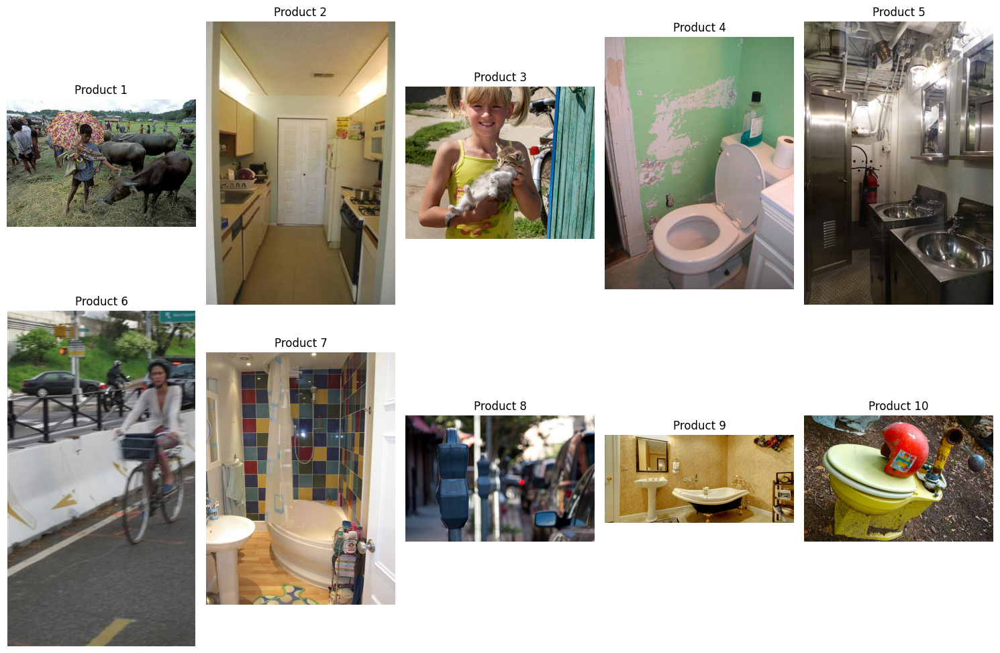


=== Try These Search Queries ===

📝 Query: 'outdoor sports equipment'
Top 3 Results:
  1. Product 10 (score: 22.807)
  2. Product 6 (score: 22.504)
  3. Product 2 (score: 21.640)

📝 Query: 'person wearing a hat'
Top 3 Results:
  1. Product 6 (score: 23.570)
  2. Product 3 (score: 22.353)
  3. Product 1 (score: 20.430)

📝 Query: 'colorful objects'
Top 3 Results:
  1. Product 10 (score: 27.310)
  2. Product 7 (score: 20.148)
  3. Product 1 (score: 19.578)

📝 Query: 'indoor furniture'
Top 3 Results:
  1. Product 9 (score: 25.193)
  2. Product 2 (score: 22.043)
  3. Product 7 (score: 21.059)


In [ ]:
# Simulate a product catalog
print("=== Visual Product Search Demo ===")
print("\nSimulating a product catalog with images from COCO...")

# Use our loaded images as "products"
product_images = images[:10] if 'images' in dir() else images_pathb[:10]
product_names = [f"Product {i+1}" for i in range(len(product_images))]

# Display the "catalog"
print(f"\nCatalog size: {len(product_images)} products")
show_images(product_images, titles=product_names, cols=5)

# Interactive search
print("\n=== Try These Search Queries ===")
sample_queries = [
    "outdoor sports equipment",
    "person wearing a hat",
    "colorful objects",
    "indoor furniture"
]

for query in sample_queries:
    print(f"\n📝 Query: '{query}'")

    if 'clip_model' in dir():
        # Use CLIP for search
        results = search_images_clip(product_images, query, top_k=3)
        print("Top 3 Results:")
        for rank, (idx, score) in enumerate(results, 1):
            print(f"  {rank}. {product_names[idx]} (score: {score:.3f})")
    else:
        print("  [Search would use CLIP embeddings]")

### 🤔 Reflection Question 6: Architecture Selection

Recall the architecture comparison from the lecture:

| Architecture | Approach | Best For |
|-------------|----------|----------|
| CLIP | Contrastive | Classification, search |
| BLIP | Projector + Gen | VQA, Captioning |
| LLaVA | Projector | Multimodal chat |
| Flamingo | Adapter | Few-shot learning |
| GPT-4V | Integrated | Complex reasoning |

**Question**: For each application below, which VLM architecture would you choose? Explain your reasoning considering:
- Task requirements
- Performance needs
- Cost constraints
- Data availability

**Applications**:
1. **Museum exhibit descriptions**: Generate engaging descriptions of artwork for visitors
2. **E-commerce search**: Let customers find products using natural language
3. **Medical diagnosis assistant**: Help doctors analyze X-rays and generate reports
4. **Social media content moderation**: Flag inappropriate images
5. **Educational chatbot**: Answer student questions about diagrams and figures

**Your Analysis**:
*(For each application, choose an architecture and explain why)*

1. **Museum exhibit descriptions**: For generating engaging descriptions of artwork, I would choose **BLIP** or potentially **LLaVA**. The task requires generating natural language descriptions and potentially answering follow-up questions from visitors, which aligns well with BLIP's captioning and VQA capabilities or LLaVA's conversational focus. Museum data might be specialized, but the need for fluent, descriptive text points away from a purely contrastive model like CLIP. Cost and performance would depend on the scale, but a fine-tuned generative model seems most appropriate.

2. **E-commerce search**: For letting customers find products using natural language queries, I would choose **CLIP**. This task is fundamentally about image-text similarity and retrieval, which is exactly what CLIP's contrastive approach excels at. Customers provide text queries, and the system needs to rank and retrieve the most relevant product images from a catalog. CLIP is known for its efficiency in creating embeddings and performing fast similarity searches across large datasets, making it suitable for a high-throughput e-commerce environment. It also requires less data for zero-shot search compared to training a generative model for the same task.

3. **Medical diagnosis assistant**: For helping doctors analyze X-rays and generate reports, I would lean towards **GPT-4V** or potentially a highly fine-tuned **BLIP/LLaVA** with significant domain adaptation. This is a high-stakes application requiring complex reasoning, accurate analysis of nuanced visual details, and generation of precise medical terminology in reports. GPT-4V's integrated architecture and advanced reasoning capabilities are better suited for this complexity and the need for potentially multimodal input (image + patient history). While fine-tuning BLIP or LLaVA is possible, the risk of hallucination and the need for deep medical understanding makes this challenging. Data availability would be a major hurdle for fine-tuning any model here.

4. **Social media content moderation**: For flagging inappropriate images, I would choose **CLIP**. This task is primarily a classification problem determining if an image falls into a predefined category of inappropriate content. CLIP's zero-shot or few-shot classification abilities make it ideal for this. I can define categories like "violent content," "hate symbols," or "explicit imagery" using text prompts, and CLIP can score the image against these categories. This allows for flexibility in defining new inappropriate content types without constant retraining. Performance needs are high throughput, and cost constraints favor a more efficient model like CLIP over a large generative one.

5. **Educational chatbot**: I would choose **LLaVA** or **BLIP**. This application requires understanding both the image (diagram/figure) and text questions, and then generating a natural language answer or explanation. LLaVA's strength in multimodal chat and instruction following makes it a strong candidate for interactive Q&A. BLIP's VQA capabilities are also directly relevant. The task goes beyond simple captioning and requires a conversational interface. The choice between LLaVA and BLIP might depend on the complexity of questions and the desired conversational depth, as well as available compute for deployment.

* * *

### Trade-off Analysis: API vs. Self-Hosted

Recall from lecture: **API Services** (GPT-4V, Claude) vs. **Self-Hosted** (CLIP, BLIP, LLaVA)

Let's analyze the trade-offs with real numbers.

In [ ]:
# Cost comparison calculator
def compare_deployment_costs(num_images_per_day, days_per_month=30):
    """
    Compare costs between API and self-hosted deployment.
    """
    total_images = num_images_per_day * days_per_month

    # API costs (approximate for GPT-4V as of 2024)
    api_cost_per_image = 0.01  # $0.01 per image (approximate)
    api_total = api_cost_per_image * total_images

    # Self-hosted costs
    gpu_instance_per_month = 500  # $500/month for GPU instance
    development_cost = 5000  # One-time setup cost
    maintenance_per_month = 1000  # Engineering time

    self_hosted_monthly = gpu_instance_per_month + maintenance_per_month
    self_hosted_first_month = self_hosted_monthly + development_cost

    # Analysis
    print("=== Cost Comparison ===")
    print(f"\nScenario: {num_images_per_day:,} images/day = {total_images:,} images/month\n")

    print(f"📱 API Service (e.g., GPT-4V):")
    print(f"   Monthly cost: ${api_total:,.2f}")
    print(f"   Pros: No infrastructure, instant scaling, always up-to-date")
    print(f"   Cons: Usage-based pricing, data privacy concerns\n")

    print(f"🖥️  Self-Hosted (e.g., BLIP on your server):")
    print(f"   First month: ${self_hosted_first_month:,.2f} (includes setup)")
    print(f"   Ongoing monthly: ${self_hosted_monthly:,.2f}")
    print(f"   Pros: Data privacy, customization, fixed costs")
    print(f"   Cons: Infrastructure management, maintenance burden\n")

    # Break-even analysis
    breakeven_months = (self_hosted_first_month - api_total) / (api_total - self_hosted_monthly)
    if breakeven_months > 0:
        print(f"💡 Break-even point: ~{breakeven_months:.1f} months")
        print(f"   After {breakeven_months:.1f} months, self-hosted becomes cheaper.")
    else:
        print(f"💡 At this volume, API service is more cost-effective.")

# Try different scenarios
print("\n=== SCENARIO 1: Small Startup ===")
compare_deployment_costs(num_images_per_day=100)

print("\n" + "="*60)
print("\n=== SCENARIO 2: Medium Business ===")
compare_deployment_costs(num_images_per_day=10000)

print("\n" + "="*60)
print("\n=== SCENARIO 3: Large Enterprise ===")
compare_deployment_costs(num_images_per_day=100000)


=== SCENARIO 1: Small Startup ===
=== Cost Comparison ===

Scenario: 100 images/day = 3,000 images/month

📱 API Service (e.g., GPT-4V):
   Monthly cost: $30.00
   Pros: No infrastructure, instant scaling, always up-to-date
   Cons: Usage-based pricing, data privacy concerns

🖥️  Self-Hosted (e.g., BLIP on your server):
   First month: $6,500.00 (includes setup)
   Ongoing monthly: $1,500.00
   Pros: Data privacy, customization, fixed costs
   Cons: Infrastructure management, maintenance burden

💡 At this volume, API service is more cost-effective.


=== SCENARIO 2: Medium Business ===
=== Cost Comparison ===

Scenario: 10,000 images/day = 300,000 images/month

📱 API Service (e.g., GPT-4V):
   Monthly cost: $3,000.00
   Pros: No infrastructure, instant scaling, always up-to-date
   Cons: Usage-based pricing, data privacy concerns

🖥️  Self-Hosted (e.g., BLIP on your server):
   First month: $6,500.00 (includes setup)
   Ongoing monthly: $1,500.00
   Pros: Data privacy, customization, f

### ✅ Knowledge Check 6: Deployment Decisions

**Question 1: Based on the cost analysis above, when does self-hosting make sense vs. using an API service?**

**Your Answer**:
Based on the cost analysis provided in the notebook, self hosting a VLM model makes more financial sense compared to using an API service primarily at higher volumes of image processing. For a small startup processing only 100 images per day (3,000 images per month), the API service cost is significantly lower ($30/month) ($1,500/month, plus initial setup) than the ongoing monthly cost of self hosting. However, for a medium business processing 10,000 images per day (300,000 images per month), the break even point where self hosting becomes cheaper is reached in just over 2 months. For a large enterprise processing 100,000 images per day (3 million images per month), the API cost ($30,000/month) is vastly higher than the self hosted cost, making self hosting the clear cost effective choice after the initial setup period.

**Question 2: What other factors (beyond cost) should influence the API vs. self-hosted decision?**

**Your Answer**:
Beyond just cost, several other critical factors should influence the decision between using a VLM API service and self hosting the model. Data privacy and security are paramount, especially for sensitive data like medical images or private user photos; self hosting provides more control and assurance over how data is handled. Latency is another key factor; for real time applications like interactive chatbots or live image analysis, self hosting on optimized infrastructure might offer lower latency than relying on external API calls. Reliability and uptime requirements are also important; while API providers offer high reliability, self hosting allows for more direct control over infrastructure and disaster recovery plans. Customization and the need for fine tuning on domain specific data are easier with self hosting, as you have full control over the model and training process. Finally, the internal technical expertise available to manage infrastructure and models is a significant consideration for self hosting.

* * *

## Section 6: Critical Analysis - Limitations and Ethics

From the lecture, we learned about critical limitations and ethical considerations. Let's explore these hands-on.

### Limitation 1: Hallucinations and Confabulations

VLMs can generate plausible but incorrect descriptions. Let's test this!

=== Testing for Hallucinations ===

Let's ask questions that require counting or reading small text...



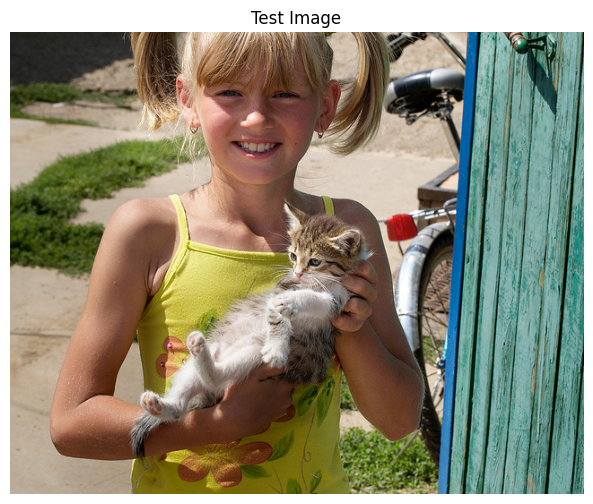

Asking challenging questions...

Q: How many objects are in this image?
A: 3

Q: What is the exact text written in the image?
A: no words

Q: What is the person thinking?
A: she ' s cute

Q: What happened right before this photo was taken?
A: cat was petted


💡 Observation:
VLMs often provide confident answers even when they can't actually
perform the task (like counting or reading small text).
This is called 'hallucination' - generating plausible but incorrect information.


In [ ]:
# Test for hallucinations
print("=== Testing for Hallucinations ===")
print("\nLet's ask questions that require counting or reading small text...\n")

# Choose an image
test_image = product_images[2] if len(product_images) > 2 else product_images[0]

plt.figure(figsize=(8, 6))
plt.imshow(test_image)
plt.axis('off')
plt.title("Test Image")
plt.show()

# Test with challenging questions
if 'blip_vqa_model' in dir():
    challenging_questions = [
        "How many objects are in this image?",
        "What is the exact text written in the image?",
        "What is the person thinking?",
        "What happened right before this photo was taken?"
    ]

    print("Asking challenging questions...\n")
    for q in challenging_questions:
        answer = answer_question_blip(test_image, q)
        print(f"Q: {q}")
        print(f"A: {answer}")
        print()
else:
    print("⚠️ VQA model not loaded. Here's what might happen:\n")
    print("Q: How many people are in this image?")
    print("A: three  [But there might be 2 or 4!]\n")
    print("Q: What is written on the sign?")
    print("A: stop  [But the text is too small to read!]\n")

print("\n💡 Observation:")
print("VLMs often provide confident answers even when they can't actually")
print("perform the task (like counting or reading small text).")
print("This is called 'hallucination' - generating plausible but incorrect information.")

### 🤔 Reflection Question 7: Hallucinations and Trust

**Question**:
1. **Why are hallucinations particularly problematic for VLMs in high-stakes applications (medical, legal, safety)?**

**Your Answer**:
I believe hallucinations are particularly problematic for Visual Language Models when deployed in high-stakes applications, such as those within the medical, legal, or safety domains, because the generation of plausible but incorrect information can lead to severe and tangible real-world consequences. In the context of healthcare, for instance, a hallucinated finding within an AI-generated report of an X-ray image could result in a delayed or entirely incorrect diagnosis, potentially jeopardizing patient outcomes. Similarly, within legal settings, a VLM's misinterpretation or fabrication of visual evidence could unduly influence case proceedings. For safety-critical systems, a hallucinated detection or failure to detect a genuine threat based on visual input could precipitate dangerous situations. These applications demand an exceptionally high degree of accuracy and unwavering reliability, and the VLM's propensity to confidently present false information fundamentally erodes trust and can directly cause harm.

2. **The lecture mentioned that "confidence doesn't correlate with accuracy." What does this mean, and why is it dangerous?**

**Your Answer**:The statement, "confidence doesn't correlate with accuracy," as mentioned in the lecture, signifies that a Visual Language Model may express a high degree of certainty in its generated output like perhaps through a high probability score for a classification or the fluent linguistic structure of a caption even when that output is factually inaccurate or constitutes a hallucination. I perceive this lack of correlation as dangerous because individuals utilizing these systems, particularly in environments where the stakes are high, are likely to place implicit trust in an AI that appears confident. If a medical professional were to rely upon a VLM's confident but erroneous analysis of an image, it could contribute to serious clinical errors. This discrepancy between perceived confidence and actual correctness creates a false sense of security and encourages poor decision-making predicated on misleading information, thereby rendering human oversight even more crucial, yet potentially challenging if the human user is influenced by the AI's expressed confidence level.

3. **How would you design a system to detect or mitigate hallucinations in production?**

**Your Answer**:To address and mitigate the issue of hallucinations in a production environment, I would advocate for implementing a multi-faceted system design. One strategy I would employ involves leveraging ensemble methods, where the outputs generated from several different models or based on varied input prompts are compared; significant discrepancies would then be automatically flagged for review by a human expert. Although confidence scoring from the model can be utilized, I would approach it with caution, perhaps establishing predefined thresholds below which outputs are either automatically routed for human verification or explicitly labeled as uncertain. For the identification of critical information, such as accurate counting or the precise transcription of small text within an image, I would integrate specialized models that are known to be more reliable for these specific tasks and cross-validate their outputs against the VLM's general response. Ultimately, I believe implementing a robust human-in-the-loop system, particularly for outputs intended for high-stakes contexts, represents the most dependable mitigation strategy.

4. **What responsibility do AI developers have to communicate these limitations to users?**

**Your Answer**:I believe that AI developers have a significant responsibility to communicate the inherent limitations of Visual Language Models to users in a manner that is both clear and transparent. This responsibility encompasses explicitly articulating that the VLM operates as an AI system whose outputs should not be regarded as definitive truths, especially when applied in critical domains. Detailed documentation, I would argue, should outline known failure modes, such as the model's susceptibility to hallucination when confronted with certain image types or complex questions. Furthermore, user interfaces should be consciously designed to visually indicate the model's level of confidence where applicable, while simultaneously facilitating and encouraging critical evaluation by users and providing readily accessible mechanisms for reporting perceived errors or requesting a review by a human. It is, in my view, paramount to proactively manage user expectations and ensure that they fully comprehend the appropriate contexts for utilizing VLM outputs and the associated risks.


-----

### Limitation 2: Bias and Fairness

VLMs can perpetuate biases present in their training data.

In [ ]:
# Conceptual exploration of bias
print("=== Understanding Bias in VLMs ===")
print("""
VLMs are trained on internet data, which contains societal biases.

Examples of potential biases:
1. Gender associations
   - "doctor" -> often associated with male images
   - "nurse" -> often associated with female images

2. Racial and cultural biases
   - Facial recognition works better on some demographics
   - Cultural contexts may be misunderstood

3. Socioeconomic biases
   - Certain lifestyles or settings over-represented
   - Professional settings may be stereotyped

4. Geographic biases
   - Western-centric training data
   - Other cultures under-represented

💡 Why this matters:
- Automated systems can perpetuate discrimination
- Affects real people's lives (hiring, lending, justice)
- Erodes trust in AI systems
- Legal and ethical implications
""")

print("\n=== Testing for Bias (Conceptual) ===")
print("""
To test for bias, you would:
1. Create a diverse test set with balanced demographics
2. Measure performance across different groups
3. Look for disparities in accuracy, caption quality, etc.
4. Analyze associations (what words/concepts cluster together)

Example test:
- Show images of doctors of different genders/races
- Check if the model consistently identifies them as "doctor"
- Or does it use different terms based on appearance?
""")

=== Understanding Bias in VLMs ===

VLMs are trained on internet data, which contains societal biases.

Examples of potential biases:
1. Gender associations
   - "doctor" -> often associated with male images
   - "nurse" -> often associated with female images

2. Racial and cultural biases
   - Facial recognition works better on some demographics
   - Cultural contexts may be misunderstood

3. Socioeconomic biases
   - Certain lifestyles or settings over-represented
   - Professional settings may be stereotyped

4. Geographic biases
   - Western-centric training data
   - Other cultures under-represented

💡 Why this matters:
- Automated systems can perpetuate discrimination
- Affects real people's lives (hiring, lending, justice)
- Erodes trust in AI systems
- Legal and ethical implications


=== Testing for Bias (Conceptual) ===

To test for bias, you would:
1. Create a diverse test set with balanced demographics
2. Measure performance across different groups
3. Look for disparities i

### 🤔 Reflection Question 8: Ethics and Responsibility

Recall the lecture's **Ethical Imperatives**:
- 🔒 **Privacy**: Images contain sensitive information
- 🔍 **Transparency**: Users must understand what's being analyzed
- ⚖️ **Fairness**: Test across diverse demographics
- 👤 **Accountability**: Human oversight for high-stakes decisions

**Question**: Consider a company deploying a VLM for automated resume screening that analyzes candidate photos.

1. **What ethical concerns does this raise?**

**Your Answer**:
Deploying a VLM for automated resume screening that analyzes candidate photos raises significant ethical concerns related to fairness, privacy, and transparency. Analyzing candidate photos introduces the risk of bias based on race, gender, age, or other protected characteristics that are visually discernible. This could lead to discriminatory hiring practices, unfairly disadvantaging qualified candidates. Privacy is a major concern as candidate photos are personal data, and using a VLM to analyze them for screening purposes could be seen as intrusive and potentially violate data protection regulations depending on the jurisdiction. Transparency is also an issue; candidates may not be aware their photo is being analyzed by AI, or how those analyses are influencing hiring decisions.

2. **What could go wrong? (Think about bias, privacy, transparency)**

**Your Answer**:
Many things could go wrong with such a system. The VLM could perpetuate existing societal biases present in its training data, leading to unfair ranking or rejection of candidates from underrepresented groups. There's a risk of privacy breaches if the system is not securely designed, exposing sensitive biometric or personal data derived from photos. The lack of transparency means candidates wouldn't understand why they were screened out, making it difficult to challenge the decision. Relying on visual cues for suitability is inherently flawed and could lead to overlooking excellent candidates who don't fit a biased visual stereotype of a "successful" employee. This undermines meritocracy and can lead to legal challenges.

3. **What safeguards would you require before deploying such a system?**

**Your Answer**:
Before deploying such a system, I would require stringent safeguards. This includes a thorough bias audit using diverse datasets to ensure fairness across different demographic groups, with clear metrics and thresholds for acceptable performance disparities. Strong data privacy measures are essential, including encryption, secure storage, and clear policies on how photo data is used and retained. Transparency is crucial; candidates must be explicitly informed that AI is used in the screening process and given an option to opt-out or have their application reviewed without photo analysis. Furthermore, human oversight must be mandatory, where the AI provides recommendations but the final decision always rests with a human recruiter or hiring manager who is trained to recognize and mitigate AI bias.

4. **Should some applications of VLMs be off-limits entirely? Which ones and why?**

**Your Answer**:
Yes, I believe some applications of VLMs should be off-limits entirely, particularly those that make high-stakes, life-altering decisions about individuals without significant human oversight or where the risk of bias and harm is unacceptably high. Examples include using VLMs for determining creditworthiness, assessing risk in the justice system, or making medical diagnoses without a mandatory human review. The resume screening scenario, while potentially useful as an *assistant* tool, falls into this category if used autonomously. These applications are too sensitive and the potential for VLM errors, biases, and lack of explainability poses too great a risk to individual rights and societal fairness.


5. **As an AI practitioner, what is your responsibility when asked to build such a system?**

**Your Answer**:
As an AI practitioner asked to build such a system, my responsibility is first and foremost to consider the ethical implications and potential societal impact. I would push back against building a system intended for autonomous decision-making in resume screening based on photos. If the goal is to use the VLM as a tool to assist human recruiters (e.g., for initial rough sorting or identifying potential candidates based on specific *objective* visual criteria, if any exist that aren't discriminatory), I would advocate for and implement all the necessary safeguards: bias testing, privacy protections, transparency, and mandatory human-in-the-loop design. My responsibility extends beyond technical implementation to ensuring the technology is used responsibly and ethically, raising concerns if the proposed application is harmful or unfair.



---



### Limitation 3: Computational Costs and Environmental Impact

From the lecture: Training costs $50K - $10M, inference takes 1-5 seconds, significant carbon footprint.

In [ ]:
# Estimate computational costs
import time

print("=== Computational Cost Analysis ===")

# Measure inference time
test_img = product_images[0]

if 'clip_model' in dir():
    # CLIP inference
    categories = ["a photo of a dog", "a photo of a cat", "a photo of a person"]

    start = time.time()
    for _ in range(10):
        _ = classify_image_clip(test_img, categories)
    end = time.time()

    avg_time = (end - start) / 10
    print(f"\nCLIP inference time: {avg_time*1000:.1f} ms per image")
    print(f"Throughput: {1/avg_time:.1f} images/second")
    print(f"For 1M images: ~{avg_time*1e6/3600:.1f} hours")

elif 'blip_caption_model' in dir():
    # BLIP inference
    start = time.time()
    for _ in range(5):
        _ = generate_caption_blip(test_img)
    end = time.time()

    avg_time = (end - start) / 5
    print(f"\nBLIP inference time: {avg_time*1000:.1f} ms per image")
    print(f"Throughput: {1/avg_time:.1f} images/second")
    print(f"For 1M images: ~{avg_time*1e6/3600:.1f} hours")

print("\n💡 Implications:")
print("- Inference cost scales linearly with usage")
print("- GPU usage -> electricity consumption -> carbon emissions")
print("- Training is FAR more expensive (thousands of GPU-hours)")
print("\nSustainability considerations:")
print("- Use smaller models when possible")
print("- Batch processing for efficiency")
print("- Consider carbon-aware computing (run during low-carbon electricity periods)")
print("- Model distillation (smaller model learns from larger one)")

=== Computational Cost Analysis ===

CLIP inference time: 21.4 ms per image
Throughput: 46.6 images/second
For 1M images: ~6.0 hours

💡 Implications:
- Inference cost scales linearly with usage
- GPU usage -> electricity consumption -> carbon emissions
- Training is FAR more expensive (thousands of GPU-hours)

Sustainability considerations:
- Use smaller models when possible
- Batch processing for efficiency
- Consider carbon-aware computing (run during low-carbon electricity periods)
- Model distillation (smaller model learns from larger one)


### ✅ Knowledge Check 7: Environmental Responsibility

**Question: A company wants to process every user-uploaded image through GPT-4V for content analysis. They process 100M images/month. What environmental and cost considerations should they think about? What alternatives might be more sustainable?**

**Your Answer**:
Processing 100 million images per month through a large Visual Language Model like GPT-4V raises significant environmental and cost considerations for me to think about. Environmentally, running this many inferences requires substantial computational power, primarily from GPUs, which consume a large amount of electricity. This contributes to a significant carbon footprint, especially if the data centers are powered by fossil fuels; the sheer scale of processing directly translates to high energy consumption. From a cost perspective, using an API service like GPT-4V on a per-image basis for such a high volume would be extremely expensive, as I saw in the earlier cost comparison where 3 million images per month already cost $30,000; 100 million images would incur a massive monthly bill.

Alternatives that might be more sustainable and cost-effective for this high-volume task include self-hosting a smaller, more efficient VLM (like a fine-tuned CLIP or a smaller BLIP model) on my own infrastructure. While self-hosting has an initial setup cost and ongoing maintenance, the marginal cost per inference is much lower at scale, leading to significant cost savings compared to a usage-based API. Environmentally, self-hosting would allow me to potentially choose data centers powered by renewable energy sources, thereby reducing my carbon footprint. I could also explore model distillation, where a smaller model is trained to mimic the behavior of a larger one, offering similar performance at a lower computational cost per inference. Batch processing images instead of processing them one by one would also improve efficiency and reduce the total compute time and energy needed.

* * *

## Section 7: Synthesis and Final Reflection

Congratulations on making it through the lab! Let's consolidate your learning.

### 🎯 Learning Outcomes Review

Let's check if we've met our learning outcomes:

1. ✅ **Understand VLMs and Their Architectures**
   - You explored CLIP's contrastive learning approach
   - Or BLIP's generation capabilities
   - You understood embeddings and shared representation spaces
   - You learned about different bridging strategies (adapters vs. projectors)

2. ✅ **Understand Applications of VLMs**
   - You implemented zero-shot classification and image search
   - Or caption generation and VQA
   - You explored real-world use cases
   - You built a mini product search system

3. ✅ **Evaluate and Apply**
   - You analyzed architectural trade-offs
   - You compared API vs. self-hosted deployment
   - You evaluated metrics and performance
   - You considered ethical implications and limitations

---

### 🤔 Final Reflection Questions

These questions require you to synthesize everything you've learned. **Take 15-20 minutes to think and write thoughtful answers.**

#### Question 1: Architecture Selection Framework

Create a decision framework for choosing a VLM architecture. Fill in the table:

| If you need...             | Consider...               | Because...                                                                                                |
|----------------------------|---------------------------|-----------------------------------------------------------------------------------------------------------|
| Zero-shot classification   | CLIP                      | It excels at measuring similarity between images and text without specific training on target categories. |
| Generate natural descriptions | BLIP or LLaVA             | These models have a language generation component that can create new text based on image content.        |
| Conversational interaction | LLaVA or BLIP (VQA)       | LLaVA is designed for multimodal chat, while BLIP's VQA allows for question-answering about images.       |
| Few-shot learning          | Flamingo or fine-tuned VLMs | These architectures or techniques are designed to adapt to new tasks with very limited examples.        |
| Complex reasoning          | GPT-4V or advanced LLaVA  | These models have more sophisticated architectures capable of integrating visual and linguistic information for deeper analysis. |

**Your Framework**:

---



#### Question 2: Real-World Design Challenge

**Scenario**: A national museum wants to create an interactive mobile app where visitors can:
- Point their camera at any exhibit
- Get a detailed description
- Ask questions about the artwork
- Hear stories and historical context

**Your task**: Design the system. Address:
1. Which VLM architecture(s) would you use? Why?

**Your Design**:
For the museum app, I would use a combination of VLM architectures. **BLIP** would be excellent for generating initial detailed descriptions of the artwork (captioning). **LLaVA** would be ideal for the interactive Q&A component, allowing visitors to ask follow-up questions about the art and receive conversational, context-aware answers. I might also incorporate **CLIP** for a visual search feature, allowing visitors to find similar artworks or information by pointing their camera at details.

2. **API service or self-hosted? Justify your choice.**

Given the potential need for customization, data privacy (visitor interactions), and potentially high usage within the museum, I would lean towards a **self-hosted** solution, or at least a hybrid approach. Self-hosting provides more control over the models, allowing for fine-tuning on the museum's specific collection and historical data. It also ensures data privacy for visitor interactions within the app. While the initial setup cost is higher than an API, the ongoing cost per inference would likely be lower at scale, and the ability to customize the models for unique exhibits is invaluable.


3. **What data would you need? How would you acquire it?**

The data needed would be extensive. I would require high-resolution images of every artwork in the museum's collection. Crucially, I would need detailed text descriptions for each piece, including artist information, historical context, provenance, and interpretations. For the Q&A feature, I would need structured data or text documents containing facts and stories about the artwork, artists, and related historical periods. Acquiring this data would involve digitizing the museum's existing archives, working with curators and art historians to write or verify descriptions and contextual information, and potentially using existing datasets for pre-training.

4. **What evaluation metrics matter for this use case?**

Evaluation metrics for this use case would be a mix. For the description generation, I would use metrics like **BLEU, METEOR, and CIDEr** to assess the linguistic quality and relevance of the generated captions against curator-written descriptions. For the Q&A feature, **VQA Accuracy** would be important, but also subjective human evaluation to assess the helpfulness and relevance of the answers. Crucially, I would use **Human Evaluation** to rate the overall user experience, the engagement level, and the perceived accuracy and richness of the information provided. User satisfaction surveys would also be vital business metrics.

5. **What could go wrong? How would you mitigate risks?**

Several things could go wrong. The VLM might hallucinate incorrect information or generate generic descriptions that aren't engaging. The Q&A might fail to understand specific art terminology or provide irrelevant answers. Performance could be slow if the models aren't optimized or the network is poor. Privacy could be compromised if interaction data isn't handled securely. To mitigate risks, I would implement rigorous testing, including expert review of generated content. I would have a robust human oversight process for adding new exhibit information. Implementing caching and optimizing models for mobile deployment would address performance. Strong encryption and clear privacy policies would protect data. A fallback mechanism to human assistance (e.g., calling a docent) could handle VLM failures.

6. **How would you ensure accessibility and inclusivity?**

Ensuring accessibility and inclusivity is paramount. The app should offer text-to-speech for descriptions and answers for visually impaired visitors. The VLM should be trained or fine-tuned on diverse examples to understand and describe artwork from various cultures and periods without bias. The language used should be clear and accessible, avoiding overly academic jargon unless specifically requested. The user interface should follow accessibility guidelines (font sizes, contrast, navigation). Providing information in multiple languages would also enhance inclusivity.

----

#### Question 3: Comparing Your Path

I completed both Path A (CLIP) and Path B (BLIP).

Limitations of CLIP compared to BLIP: CLIP cannot create new text outputs. It can only compare images to text you give it. BLIP can generate captions and answer questions from scratch. BLIP can understand more details in an image because of its design.

**Applications where CLIP is better:** CLIP is better for tasks where you need to quickly find images that match text or classify images into categories you define on the spot. It is also generally faster and uses less computing power than BLIP.

**Extending CLIP without switching:** You can use the numerical representations (embeddings) that CLIP creates. These embeddings can be used to train other, smaller models for specific tasks like predicting image tags or finding similar images in a large collection. You can also try writing better text descriptions (prompts) to get more specific results from CLIP.

**Trade-offs of generation vs. classification-only:** Models that generate text, like BLIP, are more flexible. They can describe an image or answer questions you haven't seen before. However, they are more complex and can sometimes make things up (hallucinate). Classification models like CLIP are simpler and faster but cannot create new text.

**When CLIP is preferable to BLIP:** CLIP is better when you need speed and efficiency, or when your task is simply to match images to existing text labels. If you don't need the model to write descriptions or have conversations, CLIP is often a better choice because it is less demanding on resources.

**Computational costs comparison:** Based on the lab, CLIP inference was faster than BLIP inference. This means processing images with CLIP for tasks like search is generally quicker and likely uses less energy per image compared to BLIP, especially BLIP's generative tasks like captioning which take more time. Training BLIP is also more complex and resource-intensive than training CLIP.

----

#### Question 4: The Future of VLMs

Based on what you've learned:
1. **What do you think is the biggest remaining challenge for VLMs?**

**Your Vision**:
I believe the biggest remaining challenge for VLMs is achieving truly reliable, complex reasoning and reducing hallucinations, especially in nuanced or out-of-distribution scenarios. While models are getting better at captioning and answering simple questions, understanding abstract concepts, inferring intent, or performing multi-step visual-linguistic reasoning remains difficult and prone to errors. Ensuring the model's confidence aligns with its actual accuracy is also a major hurdle that needs to be overcome for deployment in critical areas.

2. **What new applications of VLMs are you most excited about?**

I am most excited about the potential of VLMs in accessibility, particularly for visually impaired individuals. Automated, accurate, and detailed image descriptions could significantly enhance their experience online and in the real world. I am also excited about applications in scientific discovery and education, where VLMs could help researchers analyze visual data or create more interactive and personalized learning experiences by understanding diagrams and figures.

3. **What concerns you most about the widespread deployment of VLMs?**

What concerns me most about the widespread deployment of VLMs is the potential for the rapid scaling of bias and misinformation. If these models perpetuate societal biases present in training data, they could reinforce harmful stereotypes across many applications simultaneously. The risk of hallucinations being treated as fact, especially in areas like news analysis or medical information, could have serious consequences. Ensuring robust evaluation, transparency, and accountability frameworks are in place before widespread deployment is critical.

4. **If you were leading a VLM research team, what would you focus on?**

If I were leading a VLM research team, I would focus on interpretability and robustness. I would want to understand *why* a VLM makes a particular prediction or generates a specific output, moving beyond black-box models. I would also focus on making models more robust to adversarial attacks, subtle changes in images, and out-of-distribution data, while actively working to identify and mitigate biases in training data and model outputs. Developing better methods for evaluating and quantifying model uncertainty to reduce harmful hallucinations would also be a top priority.

---



#### Question 5: Ethical Leadership

Recall the lecture's **Golden Rule**: "VLMs are powerful assistants, NOT autonomous decision-makers."

**Question**:
1. **Why is this distinction important?**

**Your Answer**:
The distinction that VLMs are powerful assistants, not autonomous decision-makers, is important because it acknowledges their current limitations, particularly regarding accuracy, bias, and potential for hallucination. VLMs can process vast amounts of visual and linguistic information and provide valuable insights, summaries, or suggestions rapidly. However, they lack true understanding, common sense, and the ability to reason with the nuance required for complex or high-stakes decisions that impact human lives. Treating them as assistants emphasizes that human judgment, ethical consideration, and ultimate responsibility are still necessary, preventing over-reliance on flawed AI outputs.

2. **Give three examples of applications where VLMs should NOT be used autonomously.**

**Your Answer**:
Three examples of applications where VLMs should NOT be used autonomously are:
- **Approving or denying loan applications based solely on analysis of applicant photos or home images:** This risks perpetuating socioeconomic and demographic biases and making unfair financial decisions.
- **Making autonomous diagnoses or treatment recommendations from medical images (like X-rays or scans):** Errors or hallucinations could have life-threatening consequences for patients.
- **Determining guilt or innocence in legal proceedings by analyzing visual evidence:** The potential for misinterpretation, hallucination, or bias is too high and could lead to wrongful convictions or acquittals.


3. **How would you design "human-in-the-loop" systems for high-stakes decisions?**

**Your Answer**:
For high-stakes decisions, I would design "human-in-the-loop" systems where the VLM provides an analysis, prediction, or generated output as a *recommendation* or *input*, but the final decision rests with a qualified human expert. This involves presenting the VLM's output clearly, potentially with confidence scores or alternative interpretations, and providing the human with all the necessary context and tools to review, verify, and override the AI's suggestion. The system should log all AI outputs and human decisions for accountability and future auditing. The human expert must be empowered and trained to critically evaluate the AI's output.

4. **What training or guidelines would you give to people working with VLM outputs?**

**Your Answer**:
I would give people working with VLM outputs training and guidelines emphasizing critical evaluation and skepticism. Key points would include: understanding the specific VLM's known limitations and potential failure modes (e.g., struggles with counting, tendency to hallucinate on abstract questions); never blindly trusting the AI's confidence score; always cross-referencing VLM outputs with other reliable sources; understanding when to escalate a decision to a human expert or seek additional information; and actively providing feedback to improve the system when errors or biases are detected. The guidelines should clearly define the scope of the VLM as an assistant tool and the human's ultimate responsibility for the final outcome.



---



## Summary and Next Steps

### 🎓 What You've Accomplished

In this lab, you:
- ✅ Understood how VLMs create shared embedding spaces for vision and language
- ✅ Implemented zero-shot classification and image search (CLIP) OR caption generation and VQA (BLIP)
- ✅ Explored model architectures and learned about fine-tuning concepts
- ✅ Evaluated VLM performance using appropriate metrics
- ✅ Analyzed real-world applications and deployment trade-offs
- ✅ Critically examined limitations, biases, and ethical considerations
- ✅ Synthesized knowledge to make informed architectural decisions

### 📚 Additional Resources

To deepen your understanding:

**Papers to Read**:
- [CLIP Paper](https://arxiv.org/abs/2103.00020): "Learning Transferable Visual Models From Natural Language Supervision"
- [BLIP Paper](https://arxiv.org/abs/2201.12086): "BLIP: Bootstrapping Language-Image Pre-training"
- [LLaVA Paper](https://arxiv.org/abs/2304.08485): "Visual Instruction Tuning"

**Interactive Demos**:
- [Hugging Face Spaces](https://huggingface.co/spaces): Try CLIP, BLIP, and LLaVA demos
- [OpenAI CLIP](https://openai.com/research/clip): Official CLIP demo

**Datasets to Explore**:
- [COCO Dataset](https://cocodataset.org/): Image captioning and detection
- [Flickr30k](http://hockenmaier.cs.illinois.edu/Flickr30kEntities/): Image-caption pairs
- [Visual Genome](https://visualgenome.org/): Detailed scene understanding

**Practice Projects**:
1. Build a visual search engine for your photo library
2. Create an accessibility tool that describes images for screen readers
3. Fine-tune CLIP on a specific domain (e.g., medical images, satellite imagery)
4. Implement a bias detection tool for VLM outputs

### 🚀 Challenge: Extend This Lab

Try one of these extensions:
1. **Implement the other path**: If you did Path A, try Path B (or vice versa)
2. **Add data augmentation**: Improve robustness by testing with modified images
3. **Build a GUI**: Create a simple web interface using Gradio or Streamlit
4. **Conduct a bias audit**: Test your model on diverse images and measure fairness metrics
5. **Implement caching**: Speed up repeated queries with embedding caching

---

### 🙏 Thank You!

You've completed a comprehensive exploration of Visual Language Models. Remember:

- **VLMs are powerful tools**, but they're not magic - understand their capabilities AND limitations
- **Always evaluate critically** - high confidence doesn't mean high accuracy
- **Consider ethics first** - your decisions as an AI practitioner affect real people
- **Keep learning** - this field evolves rapidly!

**Questions or feedback?** Discuss with your instructor and classmates.

---

*Lab by Chloe Tu for ITAI 1378 - Module 08: Visual Language Models*